In [1]:
%matplotlib inline

In [2]:
from datetime import datetime
import os
from os.path import dirname, abspath, join
from os import getcwd
import sys

In [3]:
import random
import string
import pandas as pd
import numpy as np

In [4]:
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker

In [5]:
import torch
import socket
from IPython.display import clear_output

In [6]:
# seed_arg = int(sys.argv[1])
# print ("\n\nSeed ARG: ",seed_arg)
seed_arg = 1

In [7]:
seedlist = np.array([161, 314, 228, 271828, 230, 4271031, 5526538, 6610165, 9849252, 34534, 73422, 8765])
seed = seedlist[seed_arg]
random.seed(seed)
torch.manual_seed(seed)
torch.cuda.manual_seed(seed)
np.random.seed(seed)
os.environ['PYTHONHASHSEED'] = str(seed)

In [8]:
LOCATION = 'tokyo'
NAME       = 'B0'+ LOCATION.upper()+datetime.now().strftime("_%H_%M_%S")
MODELNAME  = NAME + '_' + str(seed) + '.pt'
print("\nMODEL : ", NAME)
print("SEED  : ",seed_arg)
print("HOST  : ",socket.gethostname())
print("START : ",datetime.now())


MODEL :  B0TOKYO_13_36_13
SEED  :  1
HOST  :  19c994a59e65
START :  2019-03-31 13:36:13.259980


In [9]:
class ENO(object):
    
    #no. of forecast types is 6 ranging from 0 to 5
  
    def __init__(self, location='tokyo', year=2010, shuffle=False, day_balance=False):
        self.location = location
        self.year = year
        self.day = None
        self.hr = None
        
        self.shuffle = shuffle
        self.day_balance = day_balance

        self.TIME_STEPS = None #no. of time steps in one episode
        self.NO_OF_DAYS = None #no. of days in one year
        
        self.NO_OF_DAYTYPE = 10 #no. of daytypes
        self.daycounter = 0 #to count number of days that have been passed
        
        self.sradiation = None #matrix with GSR for the entire year
        self.senergy = None #matrix with harvested energy data for the entire year
        self.fforecast = None #array with forecast values for each day
        

        self.henergy = None #harvested energy variable
        self.fcast = None #forecast variable
        self.sorted_days = [] #days sorted according to day type
        
        self.SMAX = 1000 # 1 Watt Solar Panel

    
    #function to get the solar data for the given location and year and prep it
    def get_data(self):
        #solar_data/CSV files contain the values of GSR (Global Solar Radiation in MegaJoules per meters squared per hour)
        #weather_data/CSV files contain the weather summary from 06:00 to 18:00 and 18:00 to 06:00+1
        location = self.location
        year = self.year

        THIS_DIR = getcwd()
        SDATA_DIR = abspath(join(THIS_DIR, 'solar_data'))  #abspath(join(THIS_DIR, '../../..', 'data'))
        
        sfile = SDATA_DIR + '/' + location +'/' + str(year) + '.csv'
        
        #skiprows=4 to remove unnecessary title texts
        #usecols=4 to read only the Global Solar Radiation (GSR) values
        solar_radiation = pd.read_csv(sfile, skiprows=4, encoding='shift_jisx0213', usecols=[4])
      
        #convert dataframe to numpy array
        solar_radiation = solar_radiation.values

        #convert missing data in CSV files to zero
        solar_radiation[np.isnan(solar_radiation)] = 0

        #reshape solar_radiation into no_of_daysx24 array
        solar_radiation = solar_radiation.reshape(-1,24)

        if(self.shuffle): #if class instatiation calls for shuffling the day order. Required when learning
            np.random.shuffle(solar_radiation) 
        self.sradiation = solar_radiation
        
        #GSR values (in MJ/sq.mts per hour) need to be expressed in mW
        # Conversion is accomplished by 
        # solar_energy = GSR(in MJ/m2/hr) * 1e6 * size of solar cell * efficiency of solar cell /(60x60) *1000 (to express in mW)
        # the factor of 2 in the end is assuming two solar cells
        self.senergy = 2*self.sradiation * 1e6 * (55e-3 * 70e-3) * 0.15 * 1000/(60*60)

        return 0
    
    #function to map total day radiation into type of day ranging from 0 to 5
    #the classification into day types is quite arbitrary. There is no solid logic behind this type of classification.
    
    def get_day_state(self,tot_day_radiation):
        bin_edges = np.array([0, 3.5, 6.5, 9.0, 12.5, 15.5, 18.5, 22.0, 25, 28])
        for k in np.arange(1,bin_edges.size):
            if (bin_edges[k-1] <= tot_day_radiation <= bin_edges[k]):
                day_state = k -1
                break
            else:
                day_state = bin_edges.size - 1
        return int(day_state)
    
    def get_forecast(self):
        #create a perfect forecaster.
        tot_day_radiation = np.sum(self.sradiation, axis=1) #contains total solar radiation for each day
        get_day_state = np.vectorize(self.get_day_state)
        self.fforecast = get_day_state(tot_day_radiation)
        
        #sort days depending on the type of day and shuffle them; maybe required when learning
        for fcast in range(0,6):
            fcast_days = ([i for i,x in enumerate(self.fforecast) if x == fcast])
            np.random.shuffle(fcast_days)
            self.sorted_days.append(fcast_days)
        return 0
    
    def reset(self,day=0): #it is possible to reset to the beginning of a certain day
        
        self.get_data() #first get data for the given year
        self.get_forecast() #calculate the forecast
        
        self.TIME_STEPS = self.senergy.shape[1]
        self.NO_OF_DAYS = self.senergy.shape[0]
        
        self.day = day
        self.hr = 0
        
        self.henergy = self.senergy[self.day][self.hr]
        self.fcast = self.fforecast[self.day]
        
        end_of_day = False
        end_of_year = False
        return [self.henergy, self.fcast, end_of_day, end_of_year]

    
    def step(self):
        end_of_day = False
        end_of_year = False
        if not(self.day_balance): #if daytype balance is not required
            if(self.hr < self.TIME_STEPS - 1):
                self.hr += 1
                self.henergy = self.senergy[self.day][self.hr] 
                self.fcast = self.fforecast[self.day]
            else:
                if(self.day < self.NO_OF_DAYS -1):
                    end_of_day = True
                    self.hr = 0
                    self.day += 1
                    self.henergy = self.senergy[self.day][self.hr] 
                    self.fcast = self.fforecast[self.day]
                else:
                    end_of_day = True
                    end_of_year = True
                    
        else: #when training, we want all daytypes to be equally represented for robust policy
              #obviously, the days are going to be in random order
            if(self.hr < self.TIME_STEPS - 1):
                self.hr += 1
                self.henergy = self.senergy[self.day][self.hr]
                self.fcast = self.fforecast[self.day]
            else:
                if(self.daycounter < self.NO_OF_DAYS -1):
                    end_of_day = True
                    self.daycounter += 1
                    self.hr = 0
                    daytype = random.choice(np.arange(0,self.NO_OF_DAYTYPE)) #choose random daytype
                    self.day = np.random.choice(self.sorted_days[daytype]) #choose random day from that daytype
                    self.henergy = self.senergy[self.day][self.hr] 
                    self.fcast = self.fforecast[self.day]
                else: 
                    end_of_day = True
                    end_of_year = True
                    self.daycounter = 0
        
        return [self.henergy, self.fcast, end_of_day, end_of_year]

In [10]:
class CAPM (object):
    def __init__(self,location='tokyo', year=2010, shuffle=False, trainmode=False):

        #all energy values i.e. BMIN, BMAX, BOPT, HMAX are in mWhr. Assuming one timestep is one hour
        
        self.BMIN = 0.0                #Minimum battery level that is tolerated. Maybe non-zero also
        self.BMAX = 10000.0            #Max Battery Level. May not necessarily be equal to total batter capacity [3.6V x 2500mAh]
        self.BOPT = 0.5 * self.BMAX    #Optimal Battery Level. Assuming 50% of battery is the optimum
        self.BLIM_LO = 0.15*self.BMAX
        self.BLIM_HI = 0.95*self.BMAX
        self.BSAFE_LO = 0.35*self.BMAX
        self.BSAFE_HI = 0.65*self.BMAX
        
        self.ENP_MARGIN = 0.3*self.BMAX

        
        self.HMIN = 0      #Minimum energy that can be harvested by the solar panel.
        self.HMAX = None   #Maximum energy that can be harvested by the solar panel. [500mW]
        
        self.DMAX = 500      #Maximum energy that can be consumed by the node in one time step. [~ 3.6V x 135mA]
        self.N_ACTIONS = 10  #No. of different duty cycles possible
        self.DMIN = self.DMAX/self.N_ACTIONS #Minimum energy that can be consumed by the node in one time step. [~ 3.6V x 15mA]
        
        self.binit = None     #battery at the beginning of day
        self.btrack = []      #track the mean battery level for each day
        self.atrack = []      #track the duty cycles for each day
        self.htrack = []      #track the harvested for each day
        self.batt = None      #battery variable
        self.enp = None       #enp at end of hr
        self.henergy = None   #harvested energy variable
        self.fcast = None     #forecast variable
        
        self.MUBATT = 0.6
        self.SDBATT = 0.02
        
        self.MUHENERGY = 0.5
        self.SDHENERGY = 0.2
        
        self.MUENP = 0
        self.SDENP = 0.02
        
        self.location  = location
        self.year      = year
        self.shuffle   = shuffle
        self.trainmode = trainmode
        self.eno       = None
        
        self.day_violation_flag = False
        self.violation_flag     = False
        self.violation_counter  = 0
        self.batt_full_counter  = 0
        self.batt_empty_counter = 0
        self.batt_violations    = 0

        self.NO_OF_DAYTYPE      = 10 #no. of daytypes
 
    def reset(self,day=0,batt=-1):
        henergy, fcast, day_end, year_end = self.eno.reset(day) #reset the eno environment
        self.violation_flag = False
        self.violation_counter = 0
        self.batt_violations = 0
        self.batt_full_counter  = 0
        self.batt_empty_counter = 0
        if(batt == -1):
            self.batt = self.BOPT
        else:
            self.batt = batt
            
        self.batt = np.clip(self.batt, self.BMIN, self.BMAX)
        self.binit = self.batt
        self.btrack = np.append(self.btrack, self.batt) #track battery levels

        self.enp = self.BOPT - self.batt
#         self.enp = self.binit - self.batt #enp is calculated
        self.henergy = np.clip(henergy, self.HMIN, self.HMAX) #clip henergy within HMIN and HMAX
        self.fcast = fcast
        
        norm_batt    = self.batt    /self.BMAX
        norm_enp     = self.enp     /self.BMAX
        norm_henergy = self.henergy /self.HMAX
        norm_fcast   = self.fcast   /(self.NO_OF_DAYTYPE-1)
        c_state = [norm_batt, norm_enp, norm_henergy, norm_fcast] #continuous states

        reward = 0
        
        return [c_state, reward, day_end, year_end]
    
    def getstate(self): #query the present state of the system
        norm_batt    = self.batt    /self.BMAX
        norm_enp     = self.enp     /self.BMAX
        norm_henergy = self.henergy /self.HMAX
        norm_fcast   = self.fcast   /(self.NO_OF_DAYTYPE-1)
        c_state = [norm_batt, norm_enp, norm_henergy, norm_fcast] #continuous states

        return c_state
        
    
    #reward function
    def rewardfn(self):
        violation_penalty = 0
        reward = 2 - 20*np.abs(self.enp)/self.BMAX
#         if(self.day_violation_flag):
#             violation_penalty += 3    #penalty for violating battery limits anytime during the day
        return (reward - violation_penalty)
    
    def step(self, action):
        day_end = False
        year_end = False
        self.violation_flag = False
        reward = 0
        self.atrack = np.append(self.atrack, action+1) #track duty cycles
        self.htrack = np.append(self.htrack, self.henergy)

#         action_var = np.abs(np.mean(self.atrack) - action)/9 #can vary from 0 to 1
#         reward += 0.25*(0.5 - action_var ) #reward penalizing high duty cycle variance [-0.5 to 0.5]*0.25
      
        action = np.clip(action, 0, self.N_ACTIONS-1) #action values range from (0 to N_ACTIONS-1)
        e_consumed = (action+1)*self.DMAX/self.N_ACTIONS   #energy consumed by the node
        
        
        self.batt += (self.henergy - e_consumed)
        if(self.batt <= self.BMIN or self.batt >= self.BMAX ):
                self.batt_violations += 1
        
        if(self.batt < self.BLIM_LO or self.batt > self.BLIM_HI ):
            self.violation_flag = True #penalty for violating battery limits everytime it happens
#             reward -= 2
#             if(self.batt < self.BLIM_LO): #battery depletion is more fatal than battery overflow
#                 reward -= 2
        if(self.batt <= self.BMIN ): 
            self.batt_empty_counter += 1
        if(self.batt >= self.BMAX ): 
            self.batt_full_counter  += 1
            
            
        if(self.violation_flag):
            if(self.day_violation_flag == False): #penalty for violating battery limits anytime during the day - triggers once everyday
                self.violation_counter += 1
                self.day_violation_flag = True
                
        #calculate ENP before clipping
        self.enp = self.BOPT - self.batt
        
        self.batt = np.clip(self.batt, self.BMIN, self.BMAX) #clip battery values within permitted level
        self.btrack = np.append(self.btrack, self.batt) #track battery levels
        
        
        #proceed to the next time step
       
        self.henergy, self.fcast, day_end, year_end = self.eno.step()
        self.henergy = np.clip(self.henergy, self.HMIN, self.HMAX) #clip henergy within HMIN and HMAX
                        
        if(day_end): #if eno object flags that the day has ended then give reward
            reward += self.rewardfn()
            if (self.trainmode): #reset battery to optimal level if limits are exceeded when training
#                 self.batt = np.random.uniform(self.DMAX*self.eno.TIME_STEPS/self.BMAX,0.8)*self.BMAX
#                 if (self.violation_flag):
                if np.random.uniform() < HELP : #occasionaly reset the battery
                    self.batt = self.BOPT  
            
            self.day_violation_flag = False
            self.binit = self.batt #this will be the new initial battery level for next day
            self.btrack = [] #clear battery tracker
            self.atrack = [] #clear duty cycle tracker
            self.htrack = [] #clear henergy tracker
   
        norm_batt    = self.batt    /self.BMAX
        norm_enp     = self.enp     /self.BMAX
        norm_henergy = self.henergy /self.HMAX
        norm_fcast   = self.fcast   /(self.NO_OF_DAYTYPE-1)
        c_state = [norm_batt, norm_enp, norm_henergy, norm_fcast] #continuous states
        
        return [c_state, reward, day_end, year_end]

In [11]:
# Hyper Parameters
BATCH_SIZE          = 12
WT_DECAY            = None
LR                  = 1e-4          # learning rate
EPSILON             = 0.9           # greedy policy
GAMMA               = 0.9           # reward discount
LAMBDA              = 0.95          # parameter decay
TARGET_REPLACE_ITER = 24*7*4*18     # target update frequency
MEMORY_CAPACITY     = 24*7*4*12*3   # store upto six month worth of memory   

N_ACTIONS           = 10            # no. of duty cycles (0,1,2,3,4)
N_STATES            = 4             # number of state space parameter [batt, enp, henergy, fcast]

HIDDEN_LAYER        = 50            # width of NN
NO_OF_ITERATIONS    = 100
GPU                 = False         # device
HELP                = 0.05

In [12]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import numpy as np

#Class definitions for NN model and learning algorithm
class Net(nn.Module):
    def __init__(self):
        super(Net, self).__init__()

        self.fc1 = nn.Linear(N_STATES, HIDDEN_LAYER)
        nn.init.kaiming_uniform_(self.fc1.weight)

        self.adv = nn.Linear(HIDDEN_LAYER, N_ACTIONS)
        nn.init.xavier_uniform_(self.adv.weight) 
    
        self.val = nn.Linear(HIDDEN_LAYER, 1)
        nn.init.xavier_uniform_(self.val.weight)
        
    def forward(self, x):
        x = self.fc1(x)
        x = F.relu(x)

        adv = self.adv(x)
        val = self.val(x)
        
        return val + adv - adv.mean()
    
class DQN(object):
    def __init__(self):
        if(GPU): 
            device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
        else:
            device = torch.device('cpu')
        self.eval_net, self.target_net = Net(), Net()
        self.eval_net.to(device)
        self.target_net.to(device)
        self.device = device
#         print("Neural net")
#         print(self.eval_net)
        self.learn_step_counter = 0                                     # for target updating
        self.memory_counter = 0                                         # for storing memory
        self.memory = np.zeros((MEMORY_CAPACITY, N_STATES * 2 + 2))     # initialize memory [mem: ([s], a, r, [s_]) ]
#         self.optimizer = torch.optim.RMSprop(self.eval_net.parameters(), lr=LR, alpha=0.95, eps=1e-2, weight_decay=0, momentum=0, centered=False)
        self.optimizer = torch.optim.Adam(self.eval_net.parameters(), lr=LR)

        self.running_loss = 0.0
        
        
#         self.optimizer = torch.optim.Adam(self.eval_net.parameters(), lr=LR)
#         self.optimizer = torch.optim.Adam(self.eval_net.parameters(), lr=LR, weight_decay=WT_DECAY)
        self.loss_func = nn.SmoothL1Loss()
#         self.loss_func = nn.MSELoss()
        self.nettoggle = False

    def choose_action(self, x):
        x = torch.unsqueeze(torch.FloatTensor(x), 0)
        x = x.to(self.device)

        actions_value = self.eval_net.forward(x)
        actions_value = actions_value.to(torch.device("cpu"))
        action = torch.max(actions_value, 1)[1].data.numpy()
        action = action[0] # return the argmax index
        if np.random.uniform() > EPSILON:   # greedy
            action += np.random.randint(-3, 3)
            action = int(np.clip(action, 0, N_ACTIONS-1))
        return action
    
    def choose_greedy_action(self, x):
        x = torch.unsqueeze(torch.FloatTensor(x), 0)
        x = x.to(self.device)

        # input only one sample
        if True:   # greedy
            actions_value = self.eval_net.forward(x)
            actions_value = actions_value.to(torch.device("cpu"))
            action = torch.max(actions_value, 1)[1].data.numpy()
            action = action[0] # return the argmax index
        return action

    def store_transition(self, s, a, r, s_):
        transition = np.hstack((s, [a, r], s_))
        # replace the old memory with new memory
        index = self.memory_counter % MEMORY_CAPACITY
        self.memory[index, :] = transition
        self.memory_counter += 1
    
    def store_day_transition(self, transition_rec):
        data = transition_rec
        index = self.memory_counter % MEMORY_CAPACITY
        self.memory= np.insert(self.memory, index, data,0)
        self.memory_counter += transition_rec.shape[0]

    def learn(self):
        # target parameter update
        if self.learn_step_counter % TARGET_REPLACE_ITER == 0:
            self.target_net.load_state_dict(self.eval_net.state_dict())
            self.nettoggle = not self.nettoggle
        self.learn_step_counter += 1

        # sample batch transitions
        sample_index = np.random.choice(MEMORY_CAPACITY, BATCH_SIZE)
        b_memory = self.memory[sample_index, :]
        b_s = torch.FloatTensor(b_memory[:, :N_STATES])
        b_a = torch.LongTensor(b_memory[:, N_STATES:N_STATES+1].astype(int))
        b_r = torch.FloatTensor(b_memory[:, N_STATES+1:N_STATES+2])
        b_s_ = torch.FloatTensor(b_memory[:, -N_STATES:])
        
        b_s = b_s.to(self.device)
        b_a = b_a.to(self.device)
        b_r = b_r.to(self.device)
        b_s_ = b_s_.to(self.device)

        # q_eval w.r.t the action in experience
        q_eval   = self.eval_net(b_s).gather(1, b_a)  # shape (batch, 1)
        a_eval   = self.eval_net(b_s).max(1)[1].view(BATCH_SIZE, 1) #best action according to eval_net
        q_next   = self.target_net(b_s_).detach()     # detach from graph, don't backpropagate
        q_target = b_r + GAMMA * q_next.gather(1, a_eval)   # shape (batch, 1)
        loss     = self.loss_func(q_eval, q_target)

        self.optimizer.zero_grad()
        loss.backward()
        self.optimizer.step()
        
        self.running_loss += loss.mean().item()
        if self.learn_step_counter % TARGET_REPLACE_ITER == 0:
            print('LOSS : %.3f' %(self.running_loss / TARGET_REPLACE_ITER))
            self.running_loss = 0.0

In [13]:
def stdize(s):
    MU_BATT = 0.5
    SD_BATT = 0.5
    
    MU_ENP = 0
    SD_ENP = 0.5
    
    MU_HENERGY = 0.35
    SD_HENERGY = 0.55
    
    MU_FCAST = 0.5
    SD_FCAST = 0.6
    
    norm_batt, norm_enp, norm_henergy, norm_fcast = s
    
    std_batt    = (norm_batt    - MU_BATT    )/SD_BATT
    std_enp     = (norm_enp     - MU_ENP     )/SD_ENP
    std_henergy = (norm_henergy - MU_HENERGY )/SD_HENERGY
    std_fcast   = (norm_fcast   - MU_FCAST   )/SD_FCAST

    return [std_batt, std_enp, std_henergy, std_fcast]


In [14]:
#CONSTANTS
LOCATION = 'tokyo'
YEAR = 2010
capm      = CAPM(LOCATION,YEAR,shuffle=False, trainmode=False) #instantiate the CAPM class
print("BMIN       = ", capm.BMIN)
print("BMAX       = ", capm.BMAX)
print("BOPT       = ", capm.BOPT)
print("BLIM_LO    = ", capm.BLIM_LO)
print("BLIM_HI    = ", capm.BLIM_HI)
print("BSAFE_LO   = ", capm.BSAFE_LO)
print("BSAFE_HI   = ", capm.BSAFE_HI)
print("ENP_MARGIN = ", capm.ENP_MARGIN)

BMIN       =  0.0
BMAX       =  10000.0
BOPT       =  5000.0
BLIM_LO    =  1500.0
BLIM_HI    =  9500.0
BSAFE_LO   =  3500.0
BSAFE_HI   =  6500.0
ENP_MARGIN =  3000.0


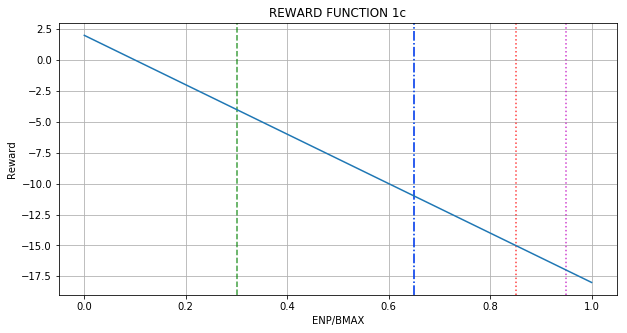

RF_1c(0)            =   2.00
RF_1c(ENP_MARGIN/4) =   0.50
RF_1c(ENP_MARGIN/2) =  -1.00
RF_1c(ENP_MARGIN)   =  -4.00

RF_1c(BMAX/2) =  -8.00
RF_1c(BMAX)   = -18.00



In [15]:
#PLOT REWARD FUNCTIONS
x = np.arange(0,capm.BMAX)
y = [capm.rewardfn() for capm.enp in x]

fig = plt.figure(figsize=(10,5))
ax = fig.add_subplot(111)
ax.set_title('REWARD FUNCTION 1c')
ax.set_xlabel('ENP/BMAX')
ax.set_ylabel('Reward')
ax.axvline((capm.ENP_MARGIN)/capm.BMAX, color='g',alpha=0.75, linestyle='--')
ax.axvline(1-(capm.BSAFE_LO)/capm.BMAX, color='c',alpha=0.75, linestyle='-.')
ax.axvline(  (capm.BSAFE_HI)/capm.BMAX, color='b',alpha=0.75, linestyle="-.")
ax.axvline(1- (capm.BLIM_LO)/capm.BMAX, color='r',alpha=0.75, linestyle=':')
ax.axvline(   (capm.BLIM_HI)/capm.BMAX, color='m',alpha=0.75, linestyle=":")
ax.plot(x/capm.BMAX,y)
ax.grid(True)
plt.show()

capm.enp = 0;            print("RF_1c(0)            = {:6.2f}".format(capm.rewardfn()) )
capm.enp = capm.ENP_MARGIN/4; print("RF_1c(ENP_MARGIN/4) = {:6.2f}".format(capm.rewardfn()) )
capm.enp = capm.ENP_MARGIN/2; print("RF_1c(ENP_MARGIN/2) = {:6.2f}".format(capm.rewardfn()) )
capm.enp = capm.ENP_MARGIN;   print("RF_1c(ENP_MARGIN)   = {:6.2f}".format(capm.rewardfn()) )
print("");
capm.enp = capm.BMAX/2; print("RF_1c(BMAX/2) = {:6.2f}".format(capm.rewardfn()) )
capm.enp = capm.BMAX;   print("RF_1c(BMAX)   = {:6.2f}".format(capm.rewardfn()) )
print("");

In [16]:
#TRAINING STARTS
tic = datetime.now()

Device:  cpu

Iteration 0:  TOKYO, 2003 
EPSILON = 5.000e-01
LR = 3.392e-05
Average Terminal Reward  = -1.326
Day Violations           =    106
Battery Limit Violations =    357
Battery FULL Violations  =    188
Battery EMPTY Violations =    169
MAX NN INPUTS:   1.000   1.040   1.182   0.833
MIN NN INPUTS:  -1.000  -1.160  -0.636  -0.833


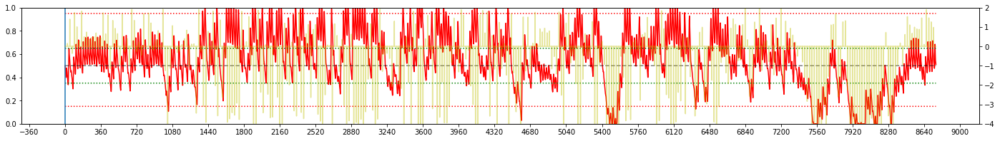


Iteration 1:  TOKYO, 2007 
EPSILON = 5.000e-01
LR = 4.174e-05
Average Terminal Reward  = -1.344
Day Violations           =    113
Battery Limit Violations =    365
Battery FULL Violations  =    322
Battery EMPTY Violations =     43
MAX NN INPUTS:   1.000   1.040   1.182   0.833
MIN NN INPUTS:  -1.000  -1.170  -0.636  -0.833


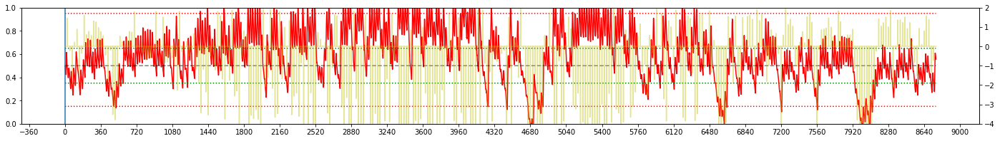


Iteration 2:  TOKYO, 2001 
EPSILON = 5.000e-01
LR = 5.000e-05
Average Terminal Reward  = -2.140
Day Violations           =    149
Battery Limit Violations =    610
Battery FULL Violations  =    293
Battery EMPTY Violations =    317
MAX NN INPUTS:   1.000   1.080   1.182   0.648
MIN NN INPUTS:  -1.000  -1.170  -0.636  -0.833


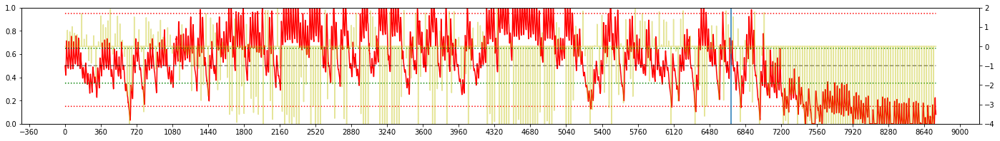


Iteration 3:  TOKYO, 2002 
EPSILON = 5.000e-01
LR = 5.826e-05
Average Terminal Reward  = -4.203
Day Violations           =    257
Battery Limit Violations =   1664
Battery FULL Violations  =    332
Battery EMPTY Violations =   1332
MAX NN INPUTS:   1.000   1.100   1.182   0.833
MIN NN INPUTS:  -1.000  -1.190  -0.636  -0.833


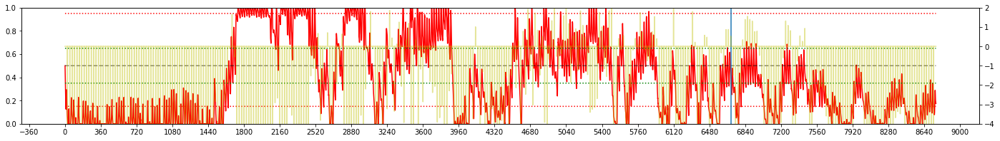

LOSS : 0.541

Iteration 4:  TOKYO, 2000 
EPSILON = 5.001e-01
LR = 6.608e-05
Average Terminal Reward  = -1.395
Day Violations           =    113
Battery Limit Violations =    479
Battery FULL Violations  =      0
Battery EMPTY Violations =    479
MAX NN INPUTS:   0.628   1.100   1.182   0.648
MIN NN INPUTS:  -1.000  -0.628  -0.636  -0.833


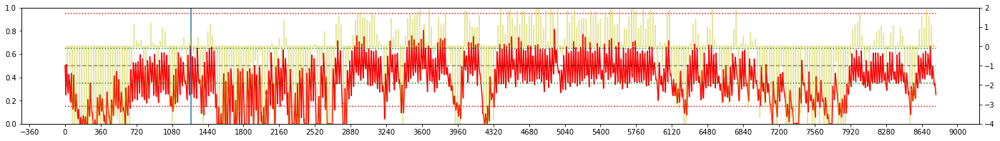

LOSS : 0.621

Iteration 5:  TOKYO, 2004 
EPSILON = 5.001e-01
LR = 7.311e-05
Average Terminal Reward  =  0.609
Day Violations           =     16
Battery Limit Violations =     19
Battery FULL Violations  =      0
Battery EMPTY Violations =     19
MAX NN INPUTS:   0.530   1.030   1.182   0.833
MIN NN INPUTS:  -1.000  -0.530  -0.636  -0.833


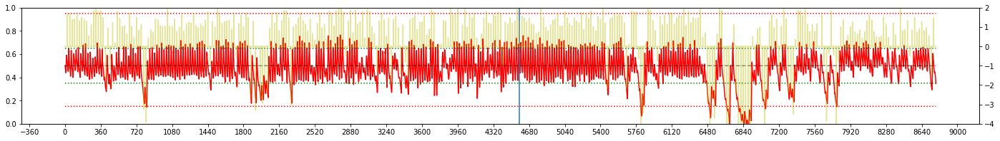

LOSS : 0.551

Iteration 6:  TOKYO, 2003 
EPSILON = 5.001e-01
LR = 7.914e-05
Average Terminal Reward  =  0.723
Day Violations           =      4
Battery Limit Violations =      6
Battery FULL Violations  =      0
Battery EMPTY Violations =      6
MAX NN INPUTS:   0.599   1.040   1.182   0.833
MIN NN INPUTS:  -1.000  -0.599  -0.636  -0.833


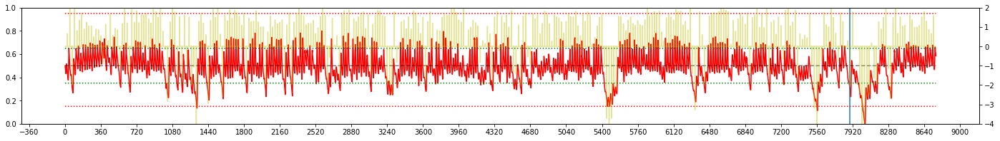


Iteration 7:  TOKYO, 2006 
EPSILON = 5.001e-01
LR = 8.411e-05
Average Terminal Reward  =  1.177
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0
MAX NN INPUTS:   0.689   0.631   1.182   0.648
MIN NN INPUTS:  -0.631  -0.689  -0.636  -0.833


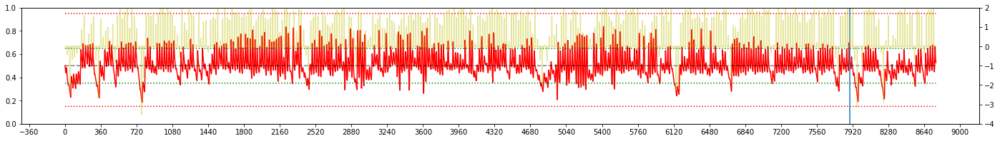

LOSS : 0.342

Iteration 8:  TOKYO, 2003 
EPSILON = 5.001e-01
LR = 8.808e-05
Average Terminal Reward  =  1.168
Day Violations           =      5
Battery Limit Violations =     60
Battery FULL Violations  =      0
Battery EMPTY Violations =     60
MAX NN INPUTS:   0.755   1.070   1.182   0.833
MIN NN INPUTS:  -1.000  -0.755  -0.636  -0.833


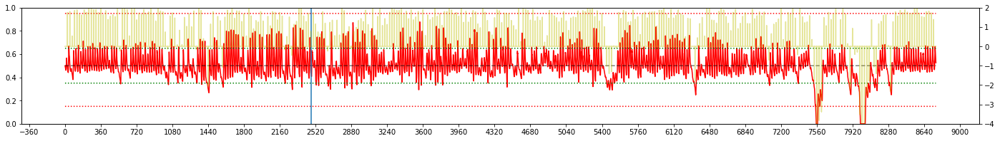

LOSS : 0.141

Iteration 9:  TOKYO, 2006 
EPSILON = 5.001e-01
LR = 9.116e-05
Average Terminal Reward  =  1.331
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0
MAX NN INPUTS:   0.779   0.604   1.182   0.648
MIN NN INPUTS:  -0.604  -0.779  -0.636  -0.833


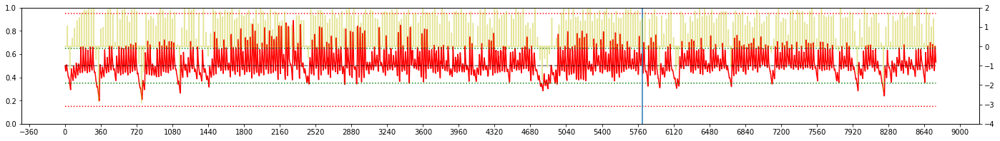


Iteration 10:  TOKYO, 2008 
EPSILON = 5.002e-01
LR = 9.350e-05
Average Terminal Reward  =  1.383
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0
MAX NN INPUTS:   0.652   0.440   1.182   0.833
MIN NN INPUTS:  -0.440  -0.652  -0.636  -0.833


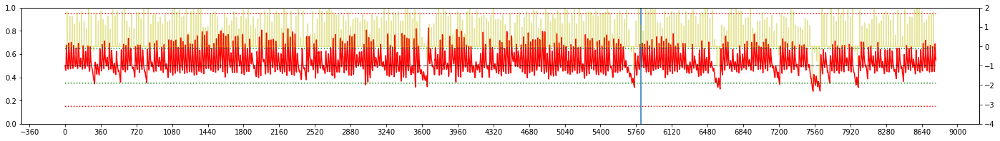

LOSS : 0.126

Iteration 11:  TOKYO, 2007 
EPSILON = 5.002e-01
LR = 9.526e-05
Average Terminal Reward  =  1.251
Day Violations           =      2
Battery Limit Violations =      8
Battery FULL Violations  =      0
Battery EMPTY Violations =      8
MAX NN INPUTS:   0.711   1.063   1.182   0.833
MIN NN INPUTS:  -1.000  -0.711  -0.636  -0.833


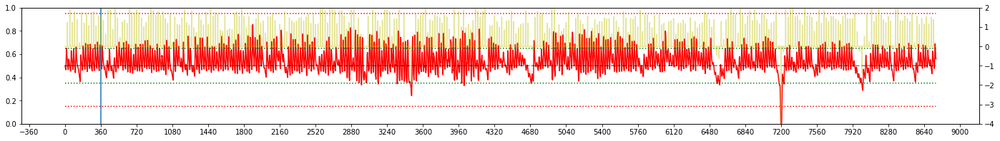

LOSS : 0.112

Iteration 12:  TOKYO, 2000 
EPSILON = 5.003e-01
LR = 9.656e-05
Average Terminal Reward  =  1.073
Day Violations           =     13
Battery Limit Violations =    100
Battery FULL Violations  =      0
Battery EMPTY Violations =    100
MAX NN INPUTS:   0.674   1.100   1.182   0.648
MIN NN INPUTS:  -1.000  -0.674  -0.636  -0.833


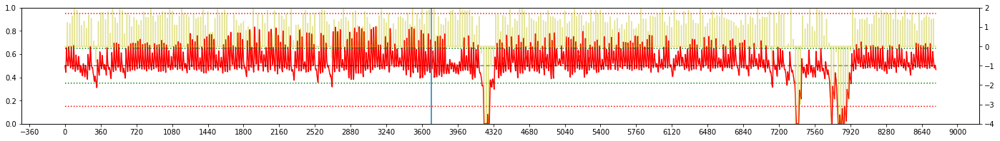

LOSS : 0.129

Iteration 13:  TOKYO, 2002 
EPSILON = 5.003e-01
LR = 9.751e-05
Average Terminal Reward  =  1.154
Day Violations           =      1
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0
MAX NN INPUTS:   0.652   0.762   1.182   0.833
MIN NN INPUTS:  -0.762  -0.652  -0.636  -0.833


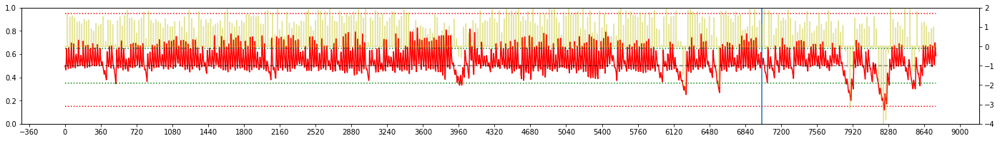


Iteration 14:  TOKYO, 2002 
EPSILON = 5.004e-01
LR = 9.820e-05
Average Terminal Reward  =  1.119
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0
MAX NN INPUTS:   0.687   0.592   1.182   0.833
MIN NN INPUTS:  -0.592  -0.687  -0.636  -0.833


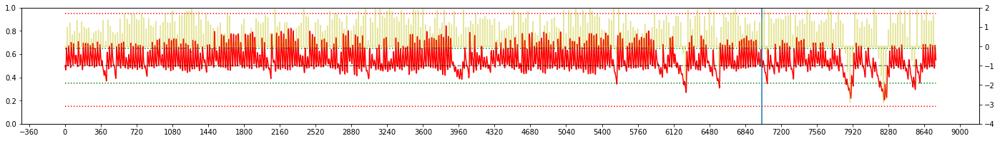

LOSS : 0.126

Iteration 15:  TOKYO, 2001 
EPSILON = 5.005e-01
LR = 9.870e-05
Average Terminal Reward  =  1.144
Day Violations           =      7
Battery Limit Violations =      5
Battery FULL Violations  =      0
Battery EMPTY Violations =      5
MAX NN INPUTS:   0.688   1.030   1.182   0.648
MIN NN INPUTS:  -1.000  -0.688  -0.636  -0.833


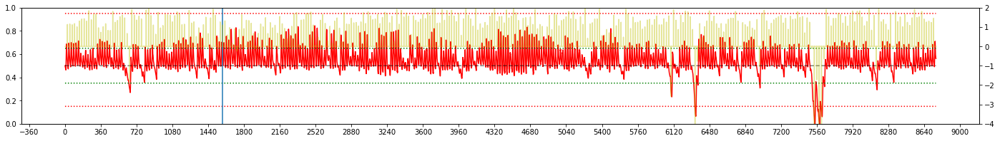

LOSS : 0.115

Iteration 16:  TOKYO, 2003 
EPSILON = 5.006e-01
LR = 9.907e-05
Average Terminal Reward  =  1.129
Day Violations           =      3
Battery Limit Violations =     13
Battery FULL Violations  =      0
Battery EMPTY Violations =     13
MAX NN INPUTS:   0.633   1.040   1.182   0.833
MIN NN INPUTS:  -1.000  -0.633  -0.636  -0.833


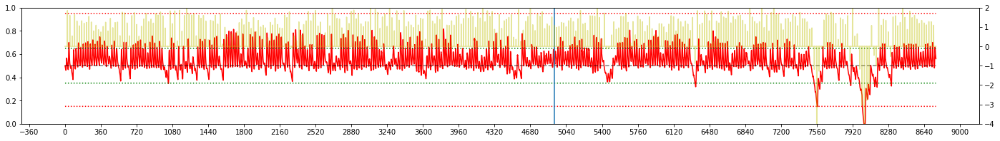

LOSS : 0.117

Iteration 17:  TOKYO, 2000 
EPSILON = 5.007e-01
LR = 9.933e-05
Average Terminal Reward  =  1.272
Day Violations           =      2
Battery Limit Violations =      1
Battery FULL Violations  =      0
Battery EMPTY Violations =      1
MAX NN INPUTS:   0.676   1.003   1.182   0.648
MIN NN INPUTS:  -1.000  -0.676  -0.636  -0.833


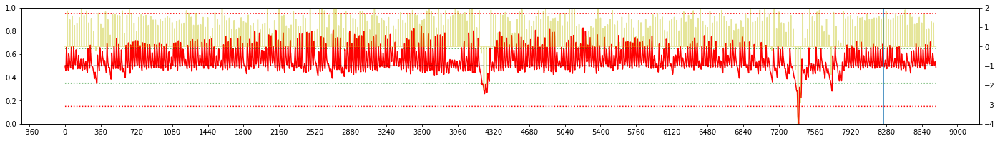


Iteration 18:  TOKYO, 2003 
EPSILON = 5.008e-01
LR = 9.952e-05
Average Terminal Reward  =  0.963
Day Violations           =      6
Battery Limit Violations =     78
Battery FULL Violations  =      0
Battery EMPTY Violations =     78
MAX NN INPUTS:   0.635   1.100   1.182   0.833
MIN NN INPUTS:  -1.000  -0.635  -0.636  -0.833


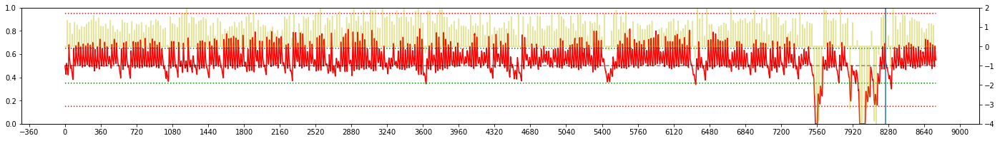

LOSS : 0.119

Iteration 19:  TOKYO, 2009 
EPSILON = 5.010e-01
LR = 9.966e-05
Average Terminal Reward  =  1.111
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0
MAX NN INPUTS:   0.663   0.697   1.182   0.648
MIN NN INPUTS:  -0.697  -0.663  -0.636  -0.833


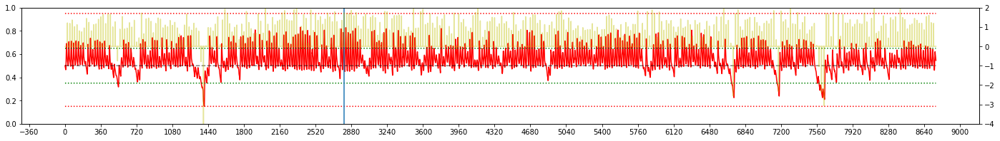

LOSS : 0.114

Iteration 20:  TOKYO, 2004 
EPSILON = 5.012e-01
LR = 9.975e-05
Average Terminal Reward  =  0.968
Day Violations           =      7
Battery Limit Violations =     58
Battery FULL Violations  =      0
Battery EMPTY Violations =     58
MAX NN INPUTS:   0.715   1.050   1.182   0.833
MIN NN INPUTS:  -1.000  -0.715  -0.636  -0.833


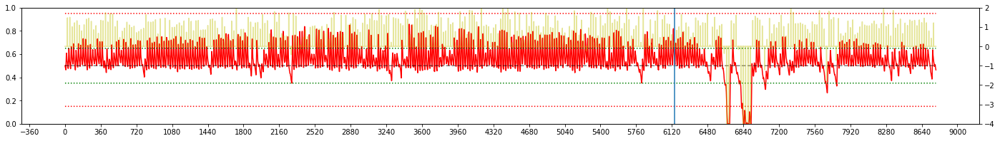


Iteration 21:  TOKYO, 2000 
EPSILON = 5.015e-01
LR = 9.982e-05
Average Terminal Reward  =  1.105
Day Violations           =      2
Battery Limit Violations =     26
Battery FULL Violations  =      0
Battery EMPTY Violations =     26
MAX NN INPUTS:   0.663   1.100   1.182   0.648
MIN NN INPUTS:  -1.000  -0.663  -0.636  -0.833


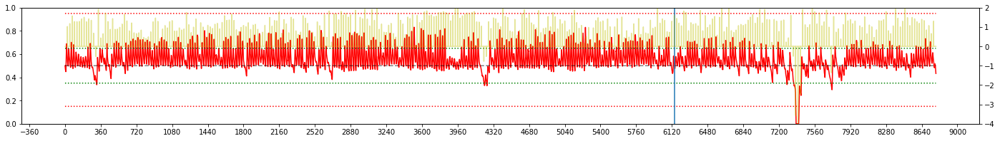

LOSS : 0.111

Iteration 22:  TOKYO, 2003 
EPSILON = 5.018e-01
LR = 9.987e-05
Average Terminal Reward  =  0.908
Day Violations           =      6
Battery Limit Violations =     66
Battery FULL Violations  =      0
Battery EMPTY Violations =     66
MAX NN INPUTS:   0.685   1.100   1.182   0.833
MIN NN INPUTS:  -1.000  -0.685  -0.636  -0.833


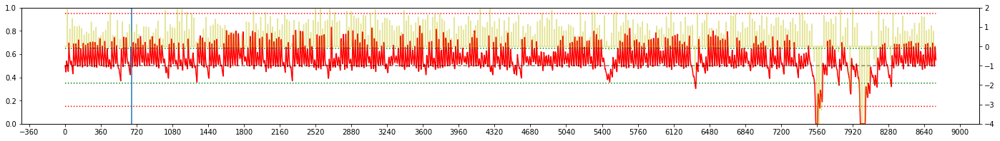

LOSS : 0.107

Iteration 23:  TOKYO, 2002 
EPSILON = 5.022e-01
LR = 9.991e-05
Average Terminal Reward  =  0.957
Day Violations           =      4
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0
MAX NN INPUTS:   0.732   0.832   1.182   0.833
MIN NN INPUTS:  -0.832  -0.732  -0.636  -0.833


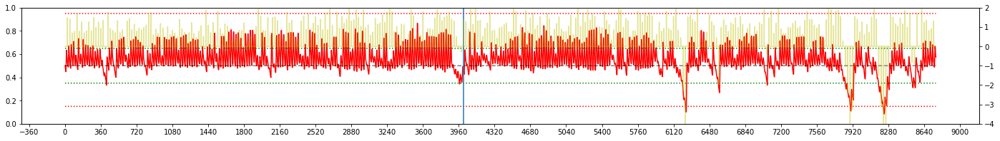

LOSS : 0.113

Iteration 24:  TOKYO, 2005 
EPSILON = 5.027e-01
LR = 9.993e-05
Average Terminal Reward  =  1.016
Day Violations           =      1
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0
MAX NN INPUTS:   0.711   0.719   1.182   0.833
MIN NN INPUTS:  -0.719  -0.711  -0.636  -0.833


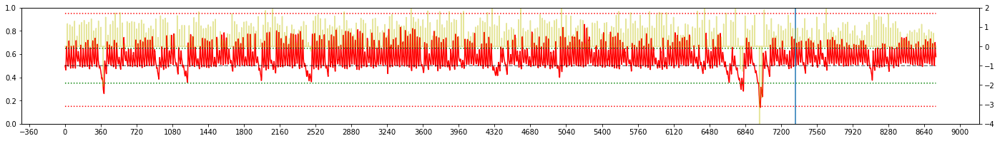


Iteration 25:  TOKYO, 2005 
EPSILON = 5.033e-01
LR = 9.995e-05
Average Terminal Reward  =  1.001
Day Violations           =      3
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0
MAX NN INPUTS:   0.669   0.848   1.182   0.833
MIN NN INPUTS:  -0.848  -0.669  -0.636  -0.833


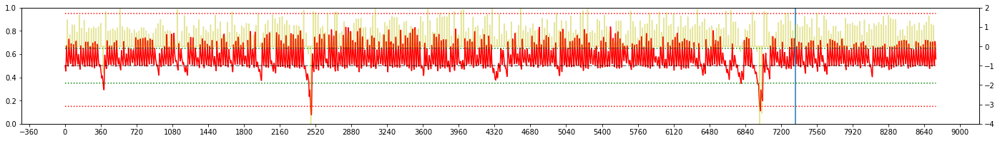

LOSS : 0.110

Iteration 26:  TOKYO, 2005 
EPSILON = 5.041e-01
LR = 9.997e-05
Average Terminal Reward  =  1.040
Day Violations           =      1
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0
MAX NN INPUTS:   0.661   0.779   1.182   0.833
MIN NN INPUTS:  -0.779  -0.661  -0.636  -0.833


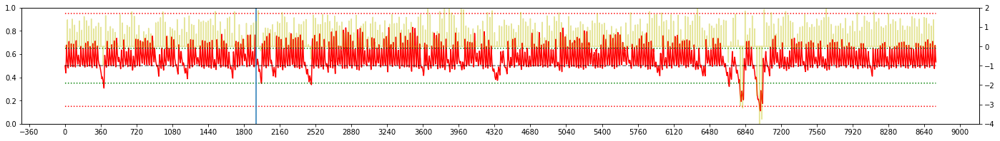

LOSS : 0.099

Iteration 27:  TOKYO, 2008 
EPSILON = 5.050e-01
LR = 9.998e-05
Average Terminal Reward  =  1.092
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0
MAX NN INPUTS:   0.763   0.424   1.182   0.833
MIN NN INPUTS:  -0.424  -0.763  -0.636  -0.833


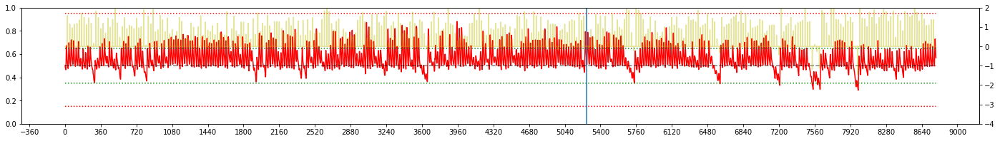

LOSS : 0.103

Iteration 28:  TOKYO, 2009 
EPSILON = 5.061e-01
LR = 9.998e-05
Average Terminal Reward  =  1.122
Day Violations           =      2
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0
MAX NN INPUTS:   0.774   0.927   1.182   0.648
MIN NN INPUTS:  -0.927  -0.774  -0.636  -0.833


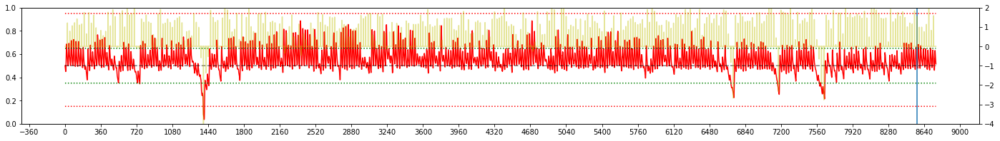


Iteration 29:  TOKYO, 2003 
EPSILON = 5.074e-01
LR = 9.999e-05
Average Terminal Reward  =  1.154
Day Violations           =      2
Battery Limit Violations =     24
Battery FULL Violations  =      0
Battery EMPTY Violations =     24
MAX NN INPUTS:   0.705   1.100   1.182   0.833
MIN NN INPUTS:  -1.000  -0.705  -0.636  -0.833


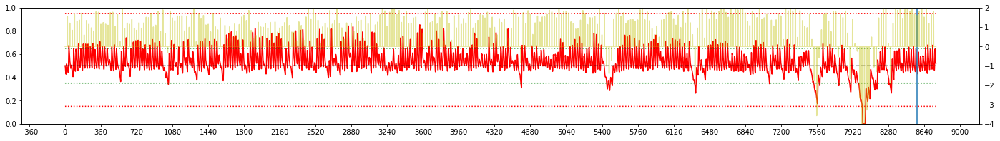

LOSS : 0.121

Iteration 30:  TOKYO, 2009 
EPSILON = 5.090e-01
LR = 9.999e-05
Average Terminal Reward  =  1.236
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0
MAX NN INPUTS:   0.746   0.641   1.182   0.648
MIN NN INPUTS:  -0.641  -0.746  -0.636  -0.833


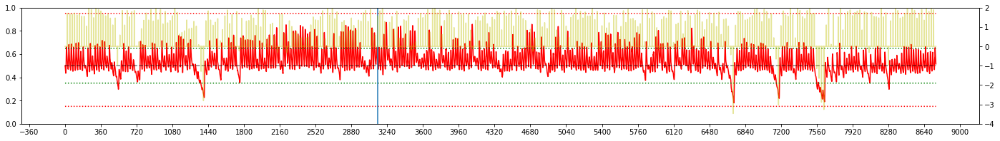

LOSS : 0.129

Iteration 31:  TOKYO, 2005 
EPSILON = 5.109e-01
LR = 9.999e-05
Average Terminal Reward  =  1.321
Day Violations           =      1
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0
MAX NN INPUTS:   0.687   0.749   1.182   0.833
MIN NN INPUTS:  -0.749  -0.687  -0.636  -0.833


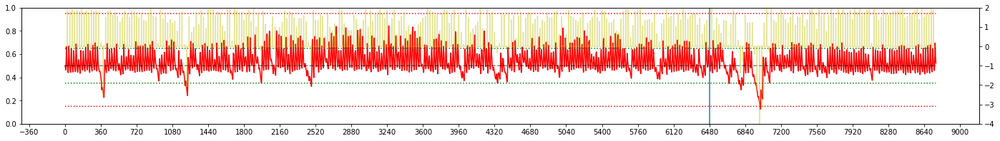


Iteration 32:  TOKYO, 2006 
EPSILON = 5.133e-01
LR = 1.000e-04
Average Terminal Reward  =  1.002
Day Violations           =     10
Battery Limit Violations =     35
Battery FULL Violations  =      0
Battery EMPTY Violations =     35
MAX NN INPUTS:   0.769   1.100   1.182   0.648
MIN NN INPUTS:  -1.000  -0.769  -0.636  -0.833


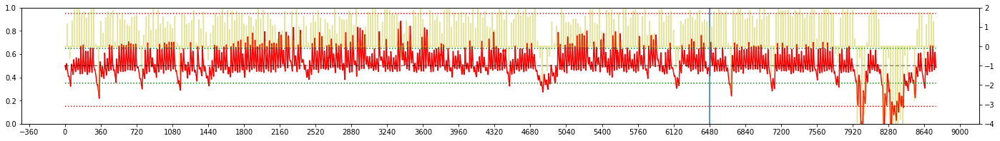

LOSS : 0.136

Iteration 33:  TOKYO, 2008 
EPSILON = 5.161e-01
LR = 1.000e-04
Average Terminal Reward  =  1.131
Day Violations           =      6
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0
MAX NN INPUTS:   0.748   0.800   1.182   0.833
MIN NN INPUTS:  -0.800  -0.748  -0.636  -0.833


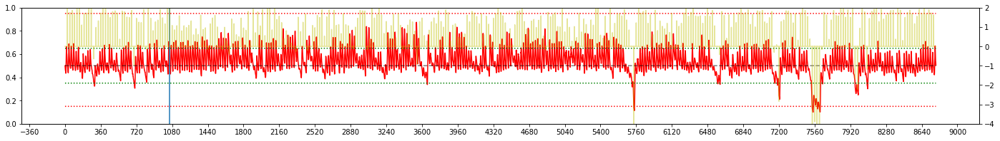

LOSS : 0.141

Iteration 34:  TOKYO, 2007 
EPSILON = 5.196e-01
LR = 1.000e-04
Average Terminal Reward  =  1.229
Day Violations           =      7
Battery Limit Violations =     40
Battery FULL Violations  =      0
Battery EMPTY Violations =     40
MAX NN INPUTS:   0.721   1.100   1.182   0.833
MIN NN INPUTS:  -1.000  -0.721  -0.636  -0.833


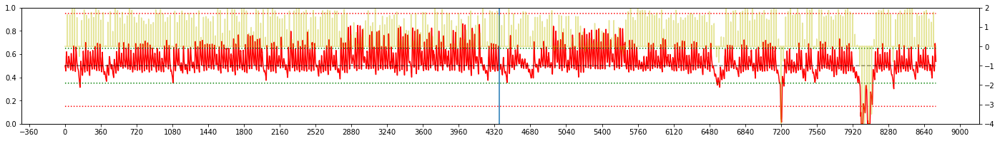

LOSS : 0.152

Iteration 35:  TOKYO, 2002 
EPSILON = 5.237e-01
LR = 1.000e-04
Average Terminal Reward  =  1.237
Day Violations           =      5
Battery Limit Violations =      1
Battery FULL Violations  =      0
Battery EMPTY Violations =      1
MAX NN INPUTS:   0.699   1.008   1.182   0.833
MIN NN INPUTS:  -1.000  -0.699  -0.636  -0.833


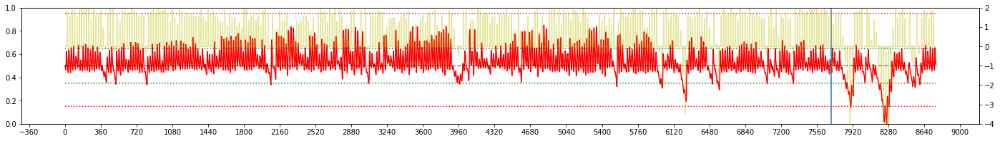


Iteration 36:  TOKYO, 2007 
EPSILON = 5.287e-01
LR = 1.000e-04
Average Terminal Reward  =  1.456
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0
MAX NN INPUTS:   0.831   0.425   1.182   0.833
MIN NN INPUTS:  -0.425  -0.831  -0.636  -0.833


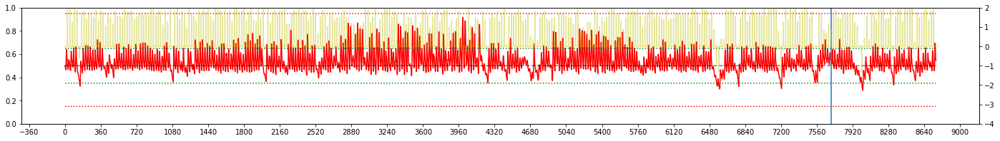

LOSS : 0.167

Iteration 37:  TOKYO, 2000 
EPSILON = 5.346e-01
LR = 1.000e-04
Average Terminal Reward  =  1.423
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0
MAX NN INPUTS:   0.699   0.624   1.182   0.648
MIN NN INPUTS:  -0.624  -0.699  -0.636  -0.833


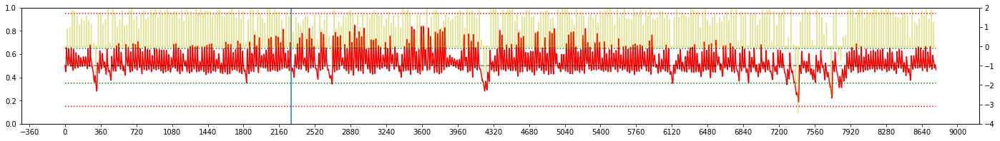

LOSS : 0.159

Iteration 38:  TOKYO, 2007 
EPSILON = 5.416e-01
LR = 1.000e-04
Average Terminal Reward  =  1.420
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0
MAX NN INPUTS:   0.771   0.470   1.182   0.833
MIN NN INPUTS:  -0.470  -0.771  -0.636  -0.833


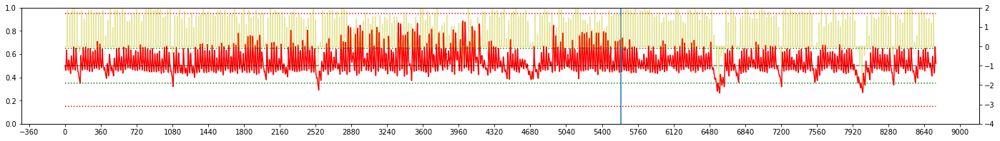


Iteration 39:  TOKYO, 2009 
EPSILON = 5.499e-01
LR = 1.000e-04
Average Terminal Reward  =  1.266
Day Violations           =      2
Battery Limit Violations =     11
Battery FULL Violations  =      0
Battery EMPTY Violations =     11
MAX NN INPUTS:   0.700   1.080   1.182   0.648
MIN NN INPUTS:  -1.000  -0.700  -0.636  -0.833


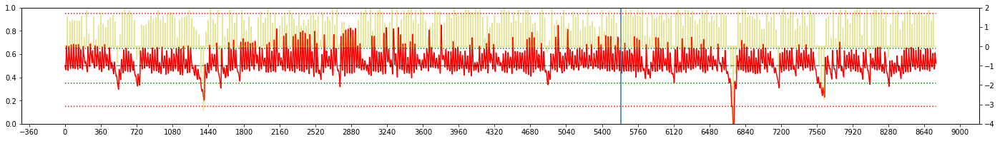

LOSS : 0.158

Iteration 40:  TOKYO, 2005 
EPSILON = 5.596e-01
LR = 1.000e-04
Average Terminal Reward  =  1.352
Day Violations           =      3
Battery Limit Violations =     26
Battery FULL Violations  =      0
Battery EMPTY Violations =     26
MAX NN INPUTS:   0.724   1.100   1.182   0.833
MIN NN INPUTS:  -1.000  -0.724  -0.636  -0.833


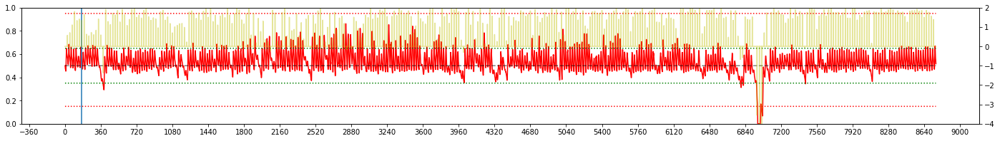

LOSS : 0.169

Iteration 41:  TOKYO, 2008 
EPSILON = 5.709e-01
LR = 1.000e-04
Average Terminal Reward  =  1.455
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0
MAX NN INPUTS:   0.748   0.600   1.182   0.833
MIN NN INPUTS:  -0.600  -0.748  -0.636  -0.833


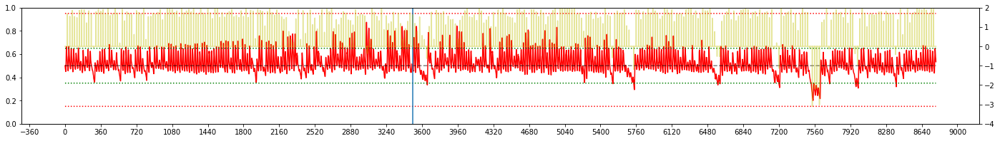

LOSS : 0.161

Iteration 42:  TOKYO, 2003 
EPSILON = 5.840e-01
LR = 1.000e-04
Average Terminal Reward  =  1.105
Day Violations           =     14
Battery Limit Violations =    162
Battery FULL Violations  =      0
Battery EMPTY Violations =    162
MAX NN INPUTS:   0.705   1.100   1.182   0.833
MIN NN INPUTS:  -1.000  -0.705  -0.636  -0.833


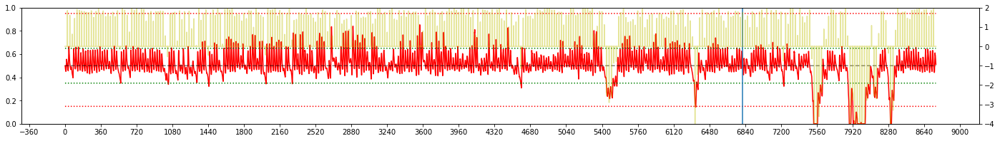


Iteration 43:  TOKYO, 2005 
EPSILON = 5.989e-01
LR = 1.000e-04
Average Terminal Reward  =  1.359
Day Violations           =      2
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0
MAX NN INPUTS:   0.707   0.836   1.182   0.833
MIN NN INPUTS:  -0.836  -0.707  -0.636  -0.833


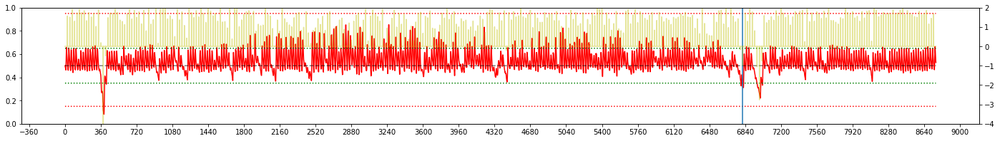

LOSS : 0.189

Iteration 44:  TOKYO, 2008 
EPSILON = 6.157e-01
LR = 1.000e-04
Average Terminal Reward  =  1.367
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0
MAX NN INPUTS:   0.775   0.440   1.182   0.833
MIN NN INPUTS:  -0.440  -0.775  -0.636  -0.833


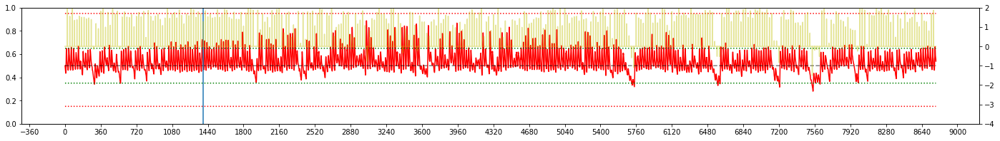

LOSS : 0.189

Iteration 45:  TOKYO, 2000 
EPSILON = 6.345e-01
LR = 1.000e-04
Average Terminal Reward  =  1.395
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0
MAX NN INPUTS:   0.706   0.634   1.182   0.648
MIN NN INPUTS:  -0.634  -0.706  -0.636  -0.833


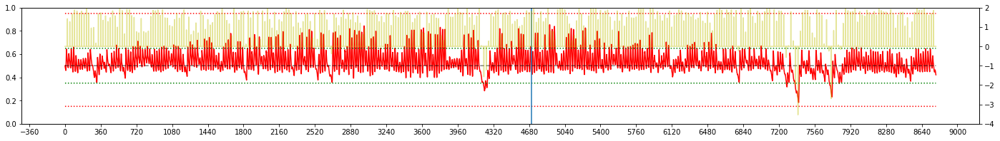

LOSS : 0.153

Iteration 46:  TOKYO, 2001 
EPSILON = 6.550e-01
LR = 1.000e-04
Average Terminal Reward  =  1.336
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0
MAX NN INPUTS:   0.721   0.427   1.182   0.648
MIN NN INPUTS:  -0.427  -0.721  -0.636  -0.833


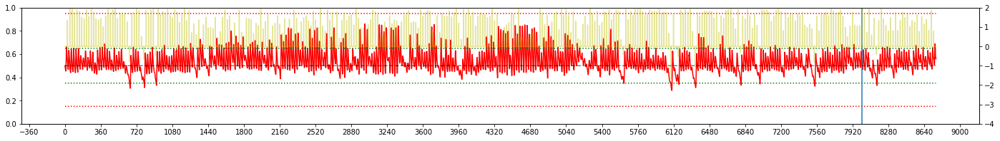


Iteration 47:  TOKYO, 2007 
EPSILON = 6.772e-01
LR = 1.000e-04
Average Terminal Reward  =  1.388
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0
MAX NN INPUTS:   0.837   0.463   1.182   0.833
MIN NN INPUTS:  -0.463  -0.837  -0.636  -0.833


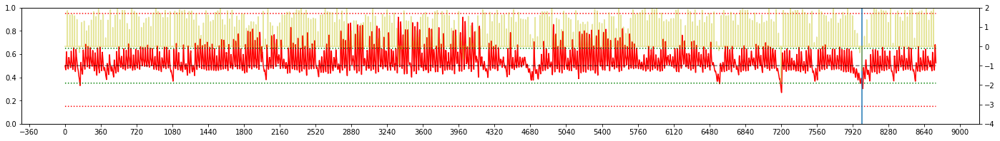

LOSS : 0.146

Iteration 48:  TOKYO, 2006 
EPSILON = 7.007e-01
LR = 1.000e-04
Average Terminal Reward  =  1.314
Day Violations           =      1
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0
MAX NN INPUTS:   0.745   0.863   1.182   0.648
MIN NN INPUTS:  -0.863  -0.745  -0.636  -0.833


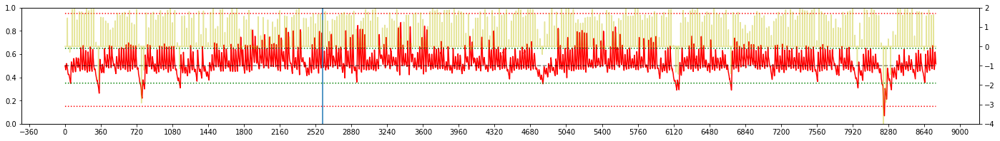

LOSS : 0.157

Iteration 49:  TOKYO, 2009 
EPSILON = 7.251e-01
LR = 1.000e-04
Average Terminal Reward  =  1.425
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0
MAX NN INPUTS:   0.720   0.617   1.182   0.648
MIN NN INPUTS:  -0.617  -0.720  -0.636  -0.833


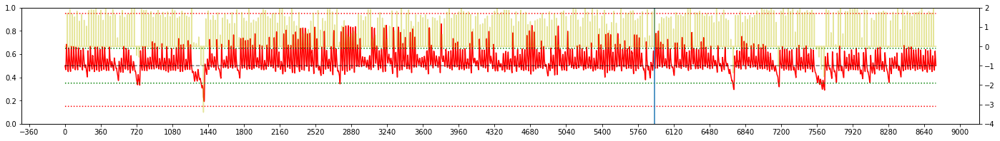


Iteration 50:  TOKYO, 2007 
EPSILON = 7.500e-01
LR = 1.000e-04
Average Terminal Reward  =  1.365
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0
MAX NN INPUTS:   0.871   0.413   1.182   0.833
MIN NN INPUTS:  -0.413  -0.871  -0.636  -0.833


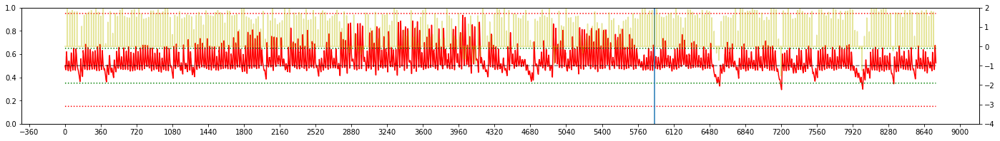

LOSS : 0.158

Iteration 51:  TOKYO, 2008 
EPSILON = 7.749e-01
LR = 8.750e-05
Average Terminal Reward  =  1.426
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0
MAX NN INPUTS:   0.808   0.358   1.182   0.833
MIN NN INPUTS:  -0.358  -0.808  -0.636  -0.833


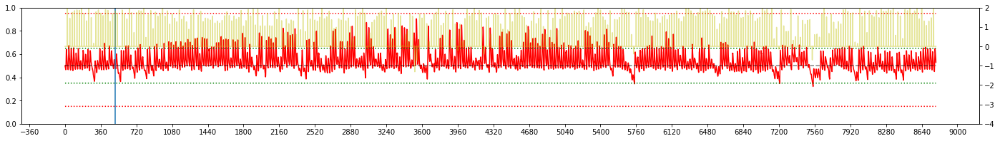

LOSS : 0.150

Iteration 52:  TOKYO, 2001 
EPSILON = 7.993e-01
LR = 7.681e-05
Average Terminal Reward  =  1.290
Day Violations           =      1
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0
MAX NN INPUTS:   0.774   0.803   1.182   0.648
MIN NN INPUTS:  -0.803  -0.774  -0.636  -0.833


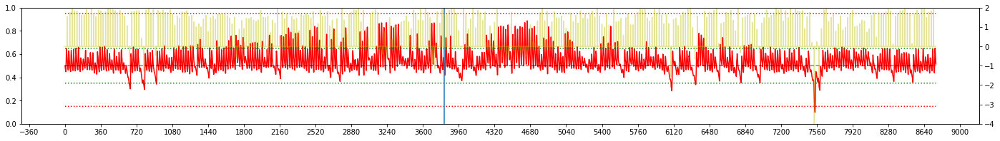

LOSS : 0.154

Iteration 53:  TOKYO, 2001 
EPSILON = 8.228e-01
LR = 6.767e-05
Average Terminal Reward  =  1.254
Day Violations           =      5
Battery Limit Violations =     25
Battery FULL Violations  =      0
Battery EMPTY Violations =     25
MAX NN INPUTS:   0.847   1.090   1.182   0.648
MIN NN INPUTS:  -1.000  -0.847  -0.636  -0.833


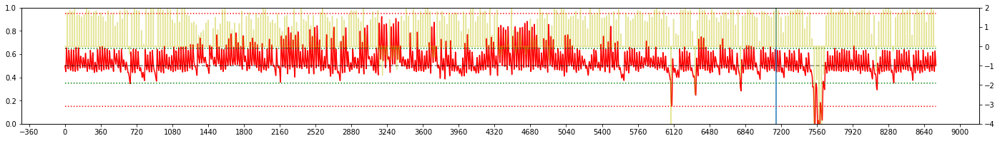


Iteration 54:  TOKYO, 2002 
EPSILON = 8.450e-01
LR = 5.986e-05
Average Terminal Reward  =  1.160
Day Violations           =      8
Battery Limit Violations =     43
Battery FULL Violations  =      0
Battery EMPTY Violations =     43
MAX NN INPUTS:   0.877   1.090   1.182   0.833
MIN NN INPUTS:  -1.000  -0.877  -0.636  -0.833


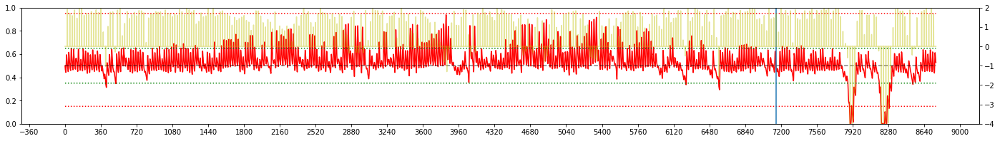

LOSS : 0.170

Iteration 55:  TOKYO, 2004 
EPSILON = 8.655e-01
LR = 5.318e-05
Average Terminal Reward  =  1.202
Day Violations           =      4
Battery Limit Violations =      6
Battery FULL Violations  =      0
Battery EMPTY Violations =      6
MAX NN INPUTS:   0.856   1.020   1.182   0.833
MIN NN INPUTS:  -1.000  -0.856  -0.636  -0.833


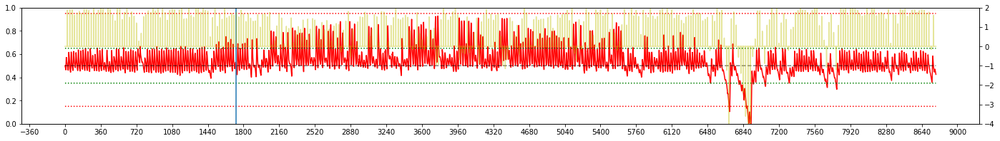

LOSS : 0.174

Iteration 56:  TOKYO, 2007 
EPSILON = 8.843e-01
LR = 4.747e-05
Average Terminal Reward  =  1.376
Day Violations           =      2
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0
MAX NN INPUTS:   0.923   0.435   1.182   0.833
MIN NN INPUTS:  -0.435  -0.923  -0.636  -0.833


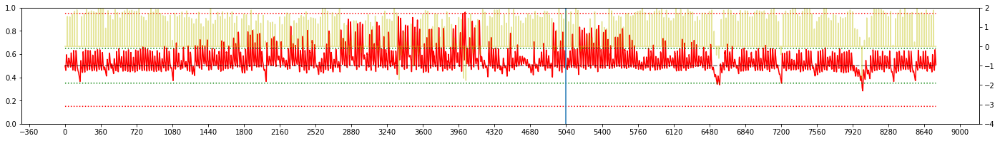

LOSS : 0.153

Iteration 57:  TOKYO, 2008 
EPSILON = 9.011e-01
LR = 4.259e-05
Average Terminal Reward  =  1.462
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0
MAX NN INPUTS:   0.818   0.330   1.182   0.833
MIN NN INPUTS:  -0.330  -0.818  -0.636  -0.833


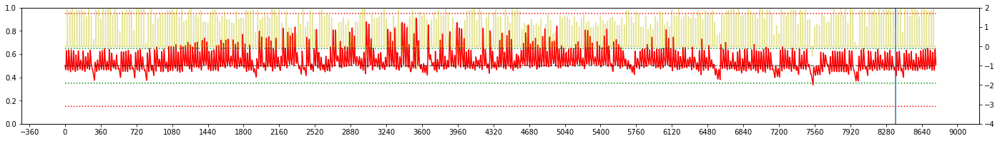


Iteration 58:  TOKYO, 2006 
EPSILON = 9.160e-01
LR = 3.841e-05
Average Terminal Reward  =  1.418
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0
MAX NN INPUTS:   0.789   0.554   1.182   0.648
MIN NN INPUTS:  -0.554  -0.789  -0.636  -0.833


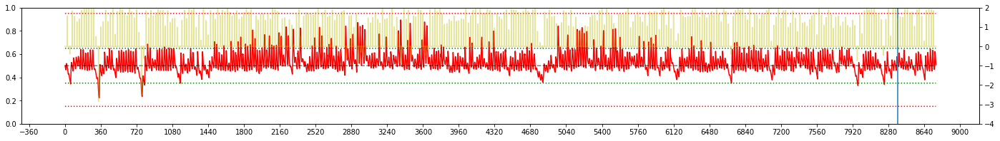

LOSS : 0.153

Iteration 59:  TOKYO, 2006 
EPSILON = 9.291e-01
LR = 3.484e-05
Average Terminal Reward  =  1.420
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0
MAX NN INPUTS:   0.802   0.431   1.182   0.648
MIN NN INPUTS:  -0.431  -0.802  -0.636  -0.833


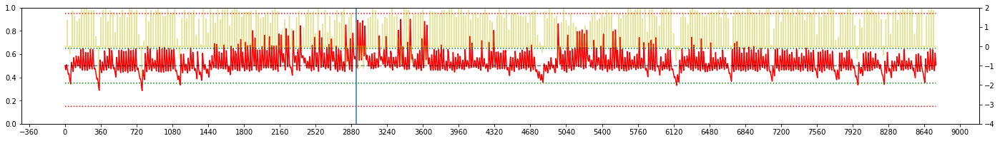

LOSS : 0.156

Iteration 60:  TOKYO, 2005 
EPSILON = 9.404e-01
LR = 3.179e-05
Average Terminal Reward  =  1.500
Day Violations           =      1
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0
MAX NN INPUTS:   0.837   0.739   1.182   0.833
MIN NN INPUTS:  -0.739  -0.837  -0.636  -0.833


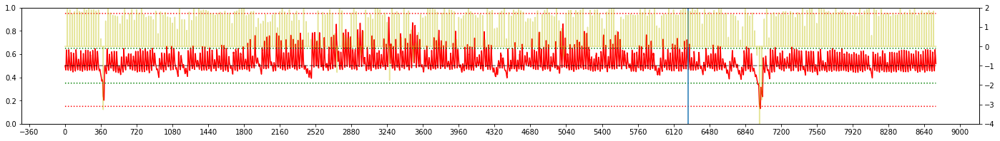


Iteration 61:  TOKYO, 2009 
EPSILON = 9.501e-01
LR = 2.918e-05
Average Terminal Reward  =  1.383
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0
MAX NN INPUTS:   0.786   0.386   1.182   0.648
MIN NN INPUTS:  -0.386  -0.786  -0.636  -0.833


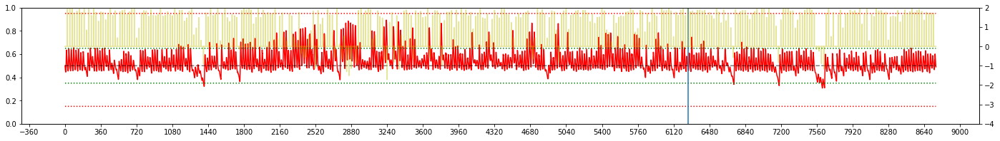

LOSS : 0.154

Iteration 62:  TOKYO, 2006 
EPSILON = 9.584e-01
LR = 2.695e-05
Average Terminal Reward  =  1.442
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0
MAX NN INPUTS:   0.779   0.474   1.182   0.648
MIN NN INPUTS:  -0.474  -0.779  -0.636  -0.833


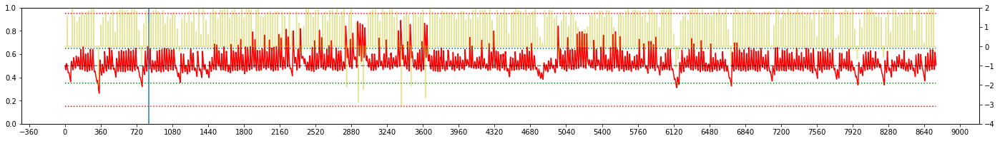

LOSS : 0.162

Iteration 63:  TOKYO, 2003 
EPSILON = 9.654e-01
LR = 2.504e-05
Average Terminal Reward  =  1.378
Day Violations           =      5
Battery Limit Violations =     51
Battery FULL Violations  =      0
Battery EMPTY Violations =     51
MAX NN INPUTS:   0.865   1.100   1.182   0.833
MIN NN INPUTS:  -1.000  -0.865  -0.636  -0.833


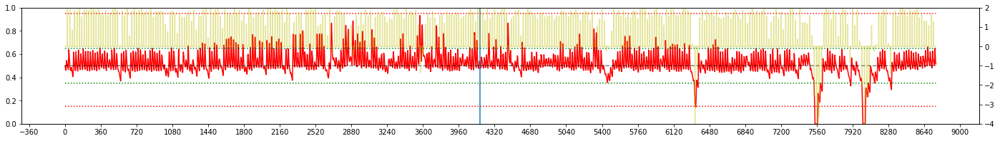

LOSS : 0.165

Iteration 64:  TOKYO, 2004 
EPSILON = 9.713e-01
LR = 2.341e-05
Average Terminal Reward  =  1.354
Day Violations           =      3
Battery Limit Violations =      4
Battery FULL Violations  =      0
Battery EMPTY Violations =      4
MAX NN INPUTS:   0.956   1.020   1.182   0.833
MIN NN INPUTS:  -1.000  -0.956  -0.636  -0.833


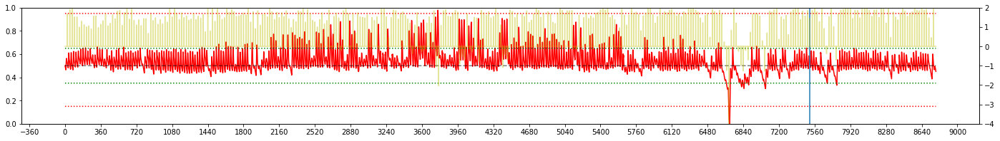


Iteration 65:  TOKYO, 2001 
EPSILON = 9.763e-01
LR = 2.202e-05
Average Terminal Reward  =  1.513
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0
MAX NN INPUTS:   0.749   0.379   1.182   0.648
MIN NN INPUTS:  -0.379  -0.749  -0.636  -0.833


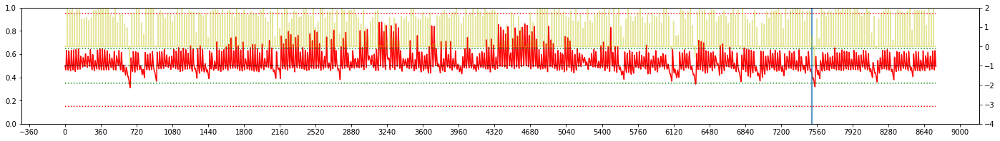

LOSS : 0.173

Iteration 66:  TOKYO, 2000 
EPSILON = 9.804e-01
LR = 2.082e-05
Average Terminal Reward  =  1.485
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0
MAX NN INPUTS:   0.749   0.504   1.182   0.648
MIN NN INPUTS:  -0.504  -0.749  -0.636  -0.833


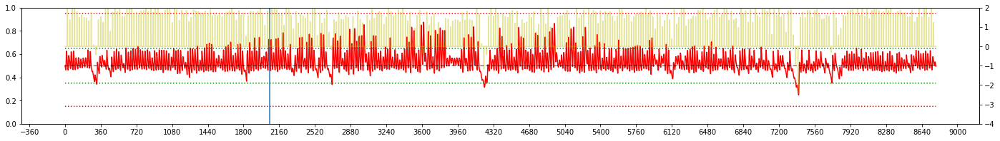

LOSS : 0.168

Iteration 67:  TOKYO, 2003 
EPSILON = 9.839e-01
LR = 1.980e-05
Average Terminal Reward  =  1.433
Day Violations           =      2
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0
MAX NN INPUTS:   0.755   0.845   1.182   0.833
MIN NN INPUTS:  -0.845  -0.755  -0.636  -0.833


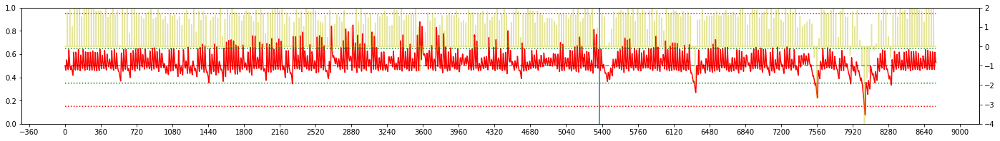

LOSS : 0.160

Iteration 68:  TOKYO, 2003 
EPSILON = 9.867e-01
LR = 1.893e-05
Average Terminal Reward  =  1.441
Day Violations           =      1
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0
MAX NN INPUTS:   0.785   0.725   1.182   0.833
MIN NN INPUTS:  -0.725  -0.785  -0.636  -0.833


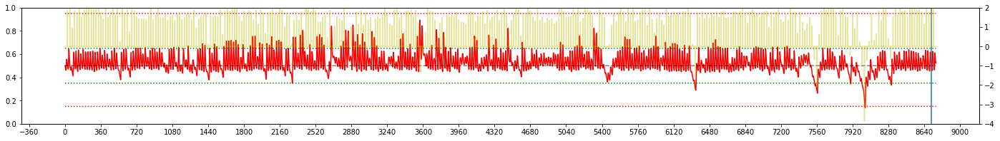


Iteration 69:  TOKYO, 2000 
EPSILON = 9.891e-01
LR = 1.819e-05
Average Terminal Reward  =  1.448
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0
MAX NN INPUTS:   0.749   0.474   1.182   0.648
MIN NN INPUTS:  -0.474  -0.749  -0.636  -0.833


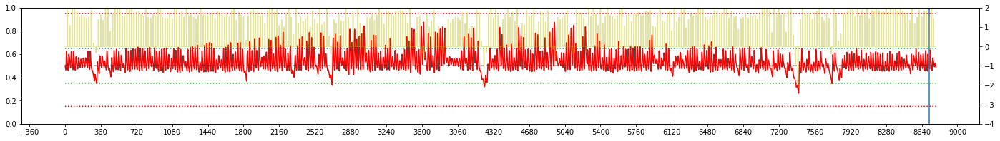

LOSS : 0.148

Iteration 70:  TOKYO, 2009 
EPSILON = 9.910e-01
LR = 1.755e-05
Average Terminal Reward  =  1.446
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0
MAX NN INPUTS:   0.730   0.366   1.182   0.648
MIN NN INPUTS:  -0.366  -0.730  -0.636  -0.833


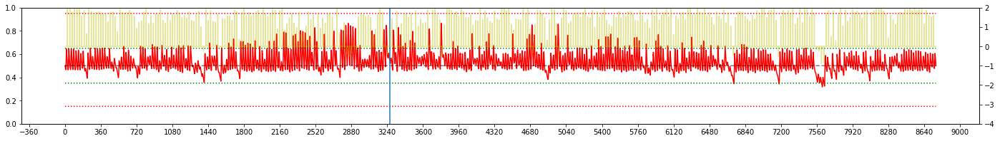

LOSS : 0.139

Iteration 71:  TOKYO, 2007 
EPSILON = 9.926e-01
LR = 1.701e-05
Average Terminal Reward  =  1.426
Day Violations           =      1
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0
MAX NN INPUTS:   0.953   0.353   1.182   0.833
MIN NN INPUTS:  -0.353  -0.953  -0.636  -0.833


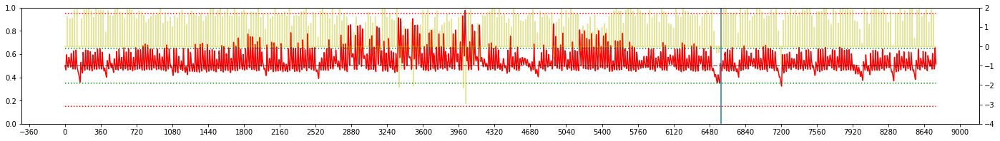


Iteration 72:  TOKYO, 2004 
EPSILON = 9.939e-01
LR = 1.654e-05
Average Terminal Reward  =  1.331
Day Violations           =      1
Battery Limit Violations =      2
Battery FULL Violations  =      2
Battery EMPTY Violations =      0
MAX NN INPUTS:   1.000   0.526   1.182   0.833
MIN NN INPUTS:  -0.526  -1.040  -0.636  -0.833


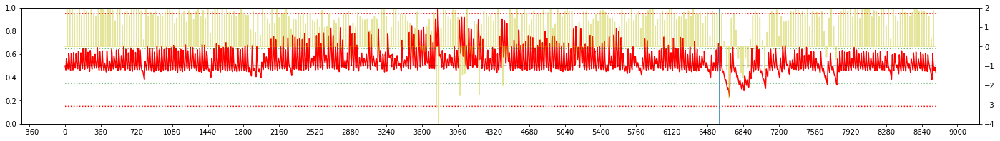

LOSS : 0.141

Iteration 73:  TOKYO, 2003 
EPSILON = 9.950e-01
LR = 1.614e-05
Average Terminal Reward  =  1.477
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0
MAX NN INPUTS:   0.795   0.595   1.182   0.833
MIN NN INPUTS:  -0.595  -0.795  -0.636  -0.833


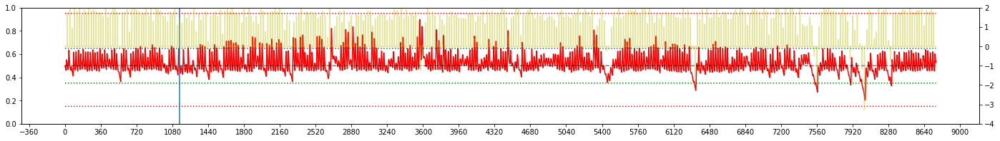

LOSS : 0.147

Iteration 74:  TOKYO, 2005 
EPSILON = 9.959e-01
LR = 1.580e-05
Average Terminal Reward  =  1.571
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0
MAX NN INPUTS:   0.747   0.479   1.182   0.833
MIN NN INPUTS:  -0.479  -0.747  -0.636  -0.833


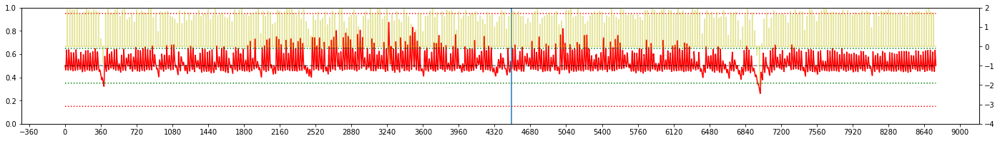

LOSS : 0.147

Iteration 75:  TOKYO, 2000 
EPSILON = 9.967e-01
LR = 1.551e-05
Average Terminal Reward  =  1.487
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0
MAX NN INPUTS:   0.679   0.474   1.182   0.648
MIN NN INPUTS:  -0.474  -0.679  -0.636  -0.833


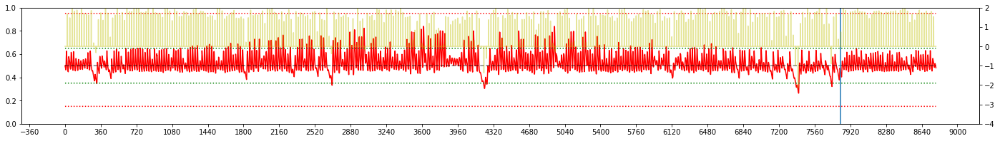


Iteration 76:  TOKYO, 2006 
EPSILON = 9.973e-01
LR = 1.526e-05
Average Terminal Reward  =  1.502
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0
MAX NN INPUTS:   0.669   0.404   1.182   0.648
MIN NN INPUTS:  -0.404  -0.669  -0.636  -0.833


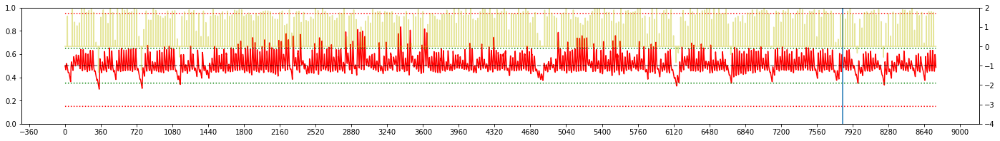

LOSS : 0.140

Iteration 77:  TOKYO, 2001 
EPSILON = 9.978e-01
LR = 1.505e-05
Average Terminal Reward  =  1.457
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0
MAX NN INPUTS:   0.704   0.363   1.182   0.648
MIN NN INPUTS:  -0.363  -0.704  -0.636  -0.833


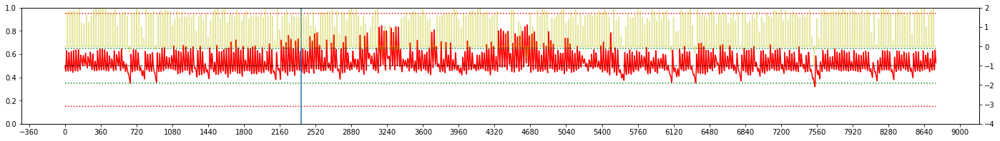

LOSS : 0.136

Iteration 78:  TOKYO, 2007 
EPSILON = 9.982e-01
LR = 1.487e-05
Average Terminal Reward  =  1.450
Day Violations           =      1
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0
MAX NN INPUTS:   0.903   0.363   1.182   0.833
MIN NN INPUTS:  -0.363  -0.903  -0.636  -0.833


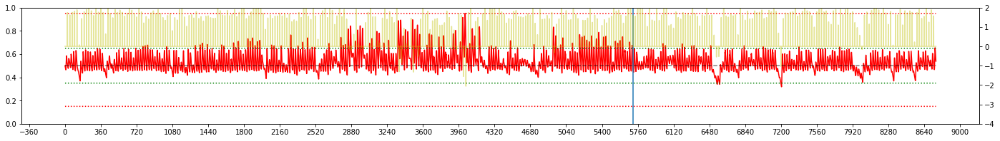


Iteration 79:  TOKYO, 2004 
EPSILON = 9.985e-01
LR = 1.471e-05
Average Terminal Reward  =  1.352
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0
MAX NN INPUTS:   0.876   0.610   1.182   0.833
MIN NN INPUTS:  -0.610  -0.876  -0.636  -0.833


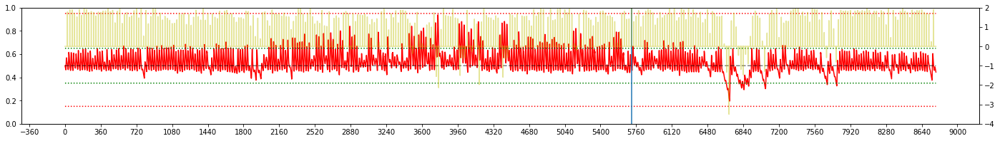

LOSS : 0.137

Iteration 80:  TOKYO, 2005 
EPSILON = 9.988e-01
LR = 1.458e-05
Average Terminal Reward  =  1.555
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0
MAX NN INPUTS:   0.757   0.469   1.182   0.833
MIN NN INPUTS:  -0.469  -0.757  -0.636  -0.833


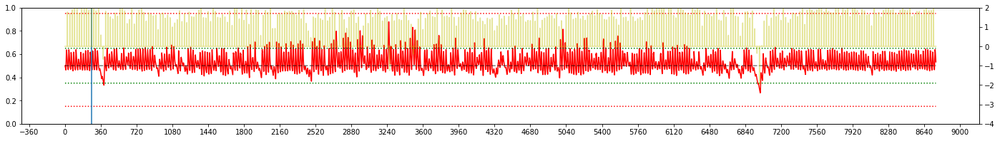

LOSS : 0.139

Iteration 81:  TOKYO, 2005 
EPSILON = 9.990e-01
LR = 1.446e-05
Average Terminal Reward  =  1.532
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0
MAX NN INPUTS:   0.747   0.479   1.182   0.833
MIN NN INPUTS:  -0.479  -0.747  -0.636  -0.833


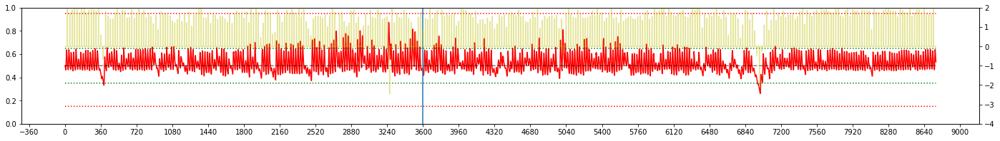

LOSS : 0.127

Iteration 82:  TOKYO, 2001 
EPSILON = 9.992e-01
LR = 1.437e-05
Average Terminal Reward  =  1.450
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0
MAX NN INPUTS:   0.699   0.353   1.182   0.648
MIN NN INPUTS:  -0.353  -0.699  -0.636  -0.833


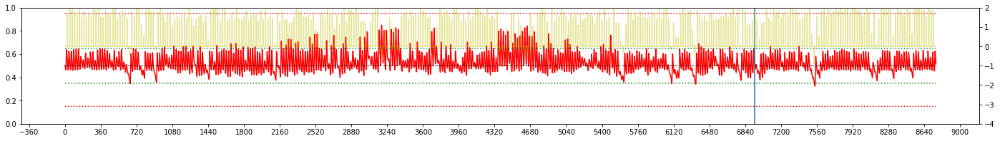


Iteration 83:  TOKYO, 2006 
EPSILON = 9.993e-01
LR = 1.428e-05
Average Terminal Reward  =  1.476
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0
MAX NN INPUTS:   0.654   0.344   1.182   0.648
MIN NN INPUTS:  -0.344  -0.654  -0.636  -0.833


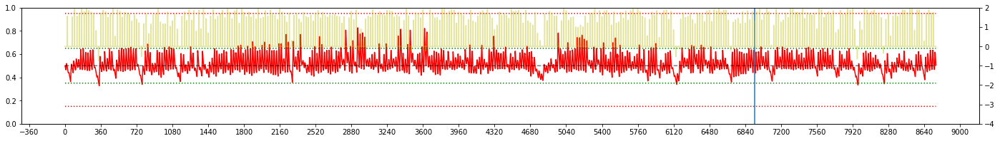

LOSS : 0.125

Iteration 84:  TOKYO, 2009 
EPSILON = 9.994e-01
LR = 1.421e-05
Average Terminal Reward  =  1.432
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0
MAX NN INPUTS:   0.646   0.361   1.182   0.648
MIN NN INPUTS:  -0.361  -0.646  -0.636  -0.833


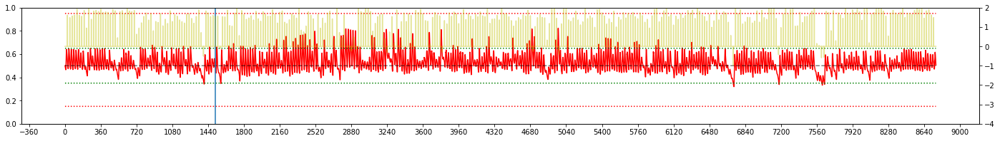

LOSS : 0.133

Iteration 85:  TOKYO, 2003 
EPSILON = 9.995e-01
LR = 1.415e-05
Average Terminal Reward  =  1.405
Day Violations           =      1
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0
MAX NN INPUTS:   0.745   0.765   1.182   0.833
MIN NN INPUTS:  -0.765  -0.745  -0.636  -0.833


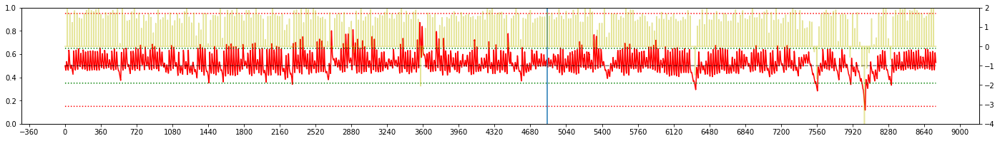

LOSS : 0.137

Iteration 86:  TOKYO, 2003 
EPSILON = 9.996e-01
LR = 1.410e-05
Average Terminal Reward  =  1.394
Day Violations           =      1
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0
MAX NN INPUTS:   0.755   0.735   1.182   0.833
MIN NN INPUTS:  -0.735  -0.755  -0.636  -0.833


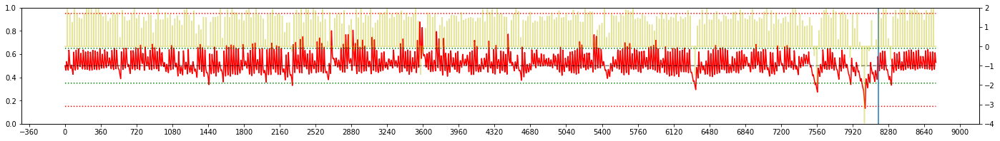


Iteration 87:  TOKYO, 2000 
EPSILON = 9.997e-01
LR = 1.406e-05
Average Terminal Reward  =  1.440
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0
MAX NN INPUTS:   0.649   0.454   1.182   0.648
MIN NN INPUTS:  -0.454  -0.649  -0.636  -0.833


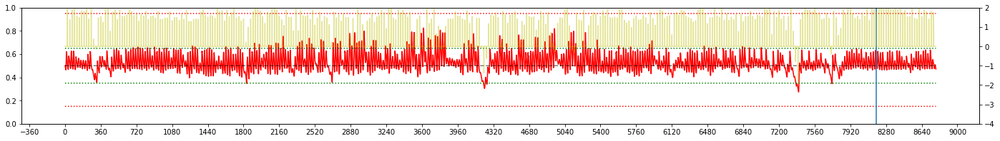

LOSS : 0.139

Iteration 88:  TOKYO, 2005 
EPSILON = 9.997e-01
LR = 1.402e-05
Average Terminal Reward  =  1.469
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0
MAX NN INPUTS:   0.727   0.459   1.182   0.833
MIN NN INPUTS:  -0.459  -0.727  -0.636  -0.833


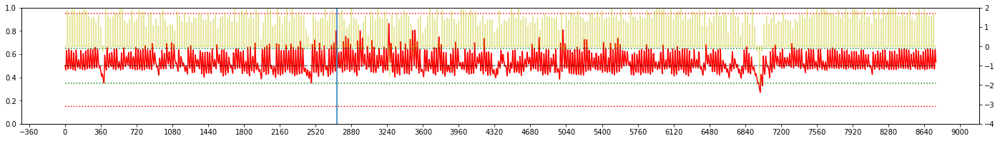

LOSS : 0.135

Iteration 89:  TOKYO, 2009 
EPSILON = 9.998e-01
LR = 1.398e-05
Average Terminal Reward  =  1.391
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0
MAX NN INPUTS:   0.646   0.343   1.182   0.648
MIN NN INPUTS:  -0.343  -0.646  -0.636  -0.833


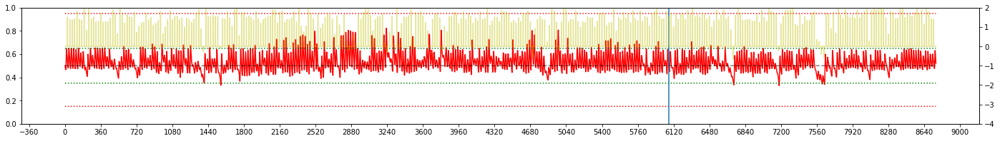


Iteration 90:  TOKYO, 2007 
EPSILON = 9.998e-01
LR = 1.396e-05
Average Terminal Reward  =  1.342
Day Violations           =      1
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0
MAX NN INPUTS:   0.953   0.383   1.182   0.833
MIN NN INPUTS:  -0.383  -0.953  -0.636  -0.833


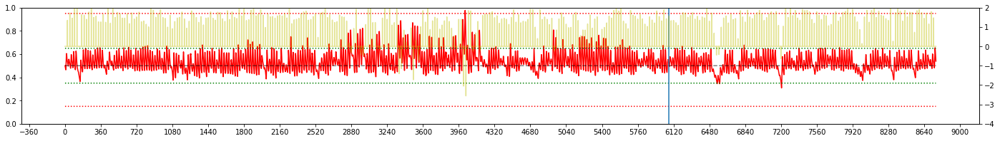

LOSS : 0.131

Iteration 91:  TOKYO, 2005 
EPSILON = 9.999e-01
LR = 1.393e-05
Average Terminal Reward  =  1.460
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0
MAX NN INPUTS:   0.687   0.469   1.182   0.833
MIN NN INPUTS:  -0.469  -0.687  -0.636  -0.833


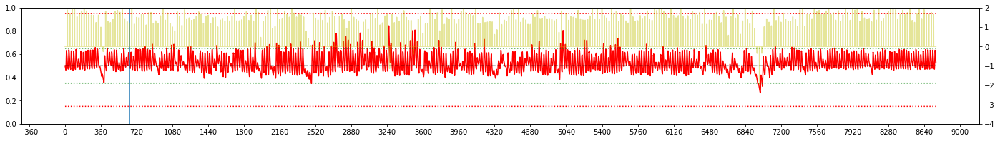

LOSS : 0.124

Iteration 92:  TOKYO, 2004 
EPSILON = 9.999e-01
LR = 1.391e-05
Average Terminal Reward  =  1.127
Day Violations           =      7
Battery Limit Violations =     69
Battery FULL Violations  =      0
Battery EMPTY Violations =     69
MAX NN INPUTS:   0.886   1.100   1.182   0.833
MIN NN INPUTS:  -1.000  -0.886  -0.636  -0.833


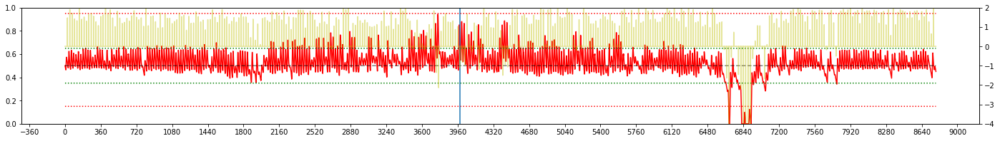

LOSS : 0.136

Iteration 93:  TOKYO, 2001 
EPSILON = 9.999e-01
LR = 1.390e-05
Average Terminal Reward  =  1.364
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0
MAX NN INPUTS:   0.699   0.343   1.182   0.648
MIN NN INPUTS:  -0.343  -0.699  -0.636  -0.833


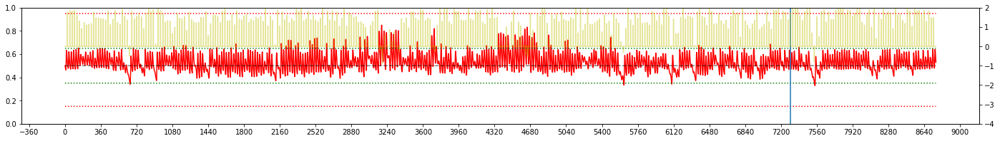


Iteration 94:  TOKYO, 2000 
EPSILON = 9.999e-01
LR = 1.388e-05
Average Terminal Reward  =  1.403
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0
MAX NN INPUTS:   0.639   0.434   1.182   0.648
MIN NN INPUTS:  -0.434  -0.639  -0.636  -0.833


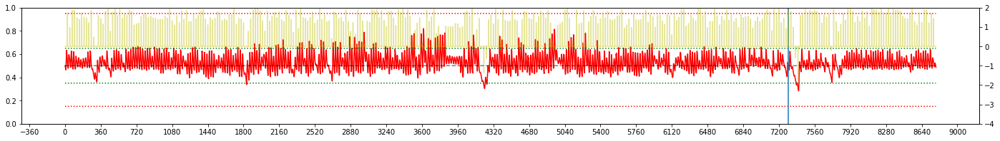

LOSS : 0.135

Iteration 95:  TOKYO, 2008 
EPSILON = 9.999e-01
LR = 1.387e-05
Average Terminal Reward  =  1.428
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0
MAX NN INPUTS:   0.677   0.300   1.182   0.833
MIN NN INPUTS:  -0.300  -0.677  -0.636  -0.833


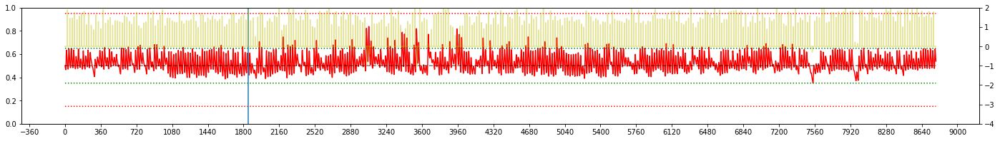

LOSS : 0.116

Iteration 96:  TOKYO, 2005 
EPSILON = 9.999e-01
LR = 1.386e-05
Average Terminal Reward  =  1.407
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0
MAX NN INPUTS:   0.647   0.469   1.182   0.833
MIN NN INPUTS:  -0.469  -0.647  -0.636  -0.833


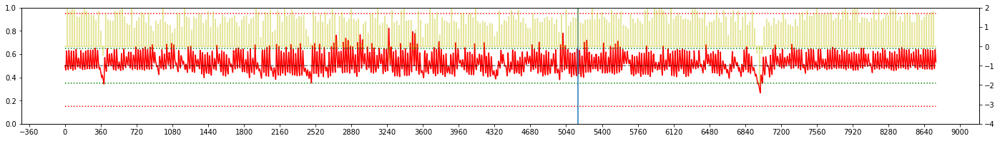

LOSS : 0.113

Iteration 97:  TOKYO, 2006 
EPSILON = 1.000e+00
LR = 1.385e-05
Average Terminal Reward  =  1.359
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0
MAX NN INPUTS:   0.589   0.354   1.182   0.648
MIN NN INPUTS:  -0.354  -0.589  -0.636  -0.833


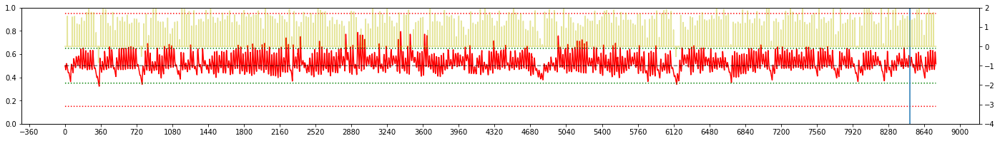


Iteration 98:  TOKYO, 2002 
EPSILON = 1.000e+00
LR = 1.384e-05
Average Terminal Reward  =  1.259
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0
MAX NN INPUTS:   0.756   0.462   1.182   0.833
MIN NN INPUTS:  -0.462  -0.756  -0.636  -0.833


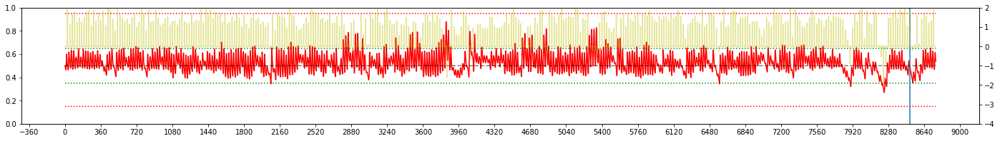

LOSS : 0.119

Iteration 99:  TOKYO, 2000 
EPSILON = 1.000e+00
LR = 1.383e-05
Average Terminal Reward  =  1.377
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0
MAX NN INPUTS:   0.608   0.444   1.182   0.648
MIN NN INPUTS:  -0.444  -0.608  -0.636  -0.833


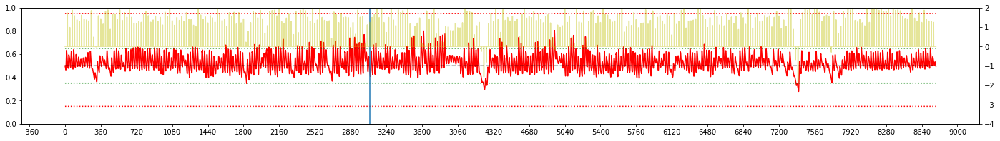

In [17]:
#TRAIN 
dqn = DQN()
# # for recording weights
# oldfc1 = dqn.eval_net.fc1.weight.data.cpu().numpy().flatten()
# old2fc1 = oldfc1

# # oldfc2 = dqn.eval_net.fc2.weight.data.cpu().numpy().flatten()
# # old2fc2 = oldfc2

# # oldfc3 = dqn.eval_net.fc3.weight.data.cpu().numpy().flatten()
# # old2fc3 = oldfc3

# oldout = dqn.eval_net.fc_out.weight.data.cpu().numpy().flatten()
# old2out = oldout
# ########################################

change_hr = 0 #when dqn target_net is updated by eval_net
avg_reward_rec = [] #record the yearly average rewards over the entire duration of training
batt_violation_rec = []
day_violation_rec = []

print('Device: ', dqn.device)
#TRAINING STARTS
tic = datetime.now()

e_rec = []
lr_rec = []
for iteration in range(NO_OF_ITERATIONS):
    max_b       = 0
    max_enp     = 0
    max_henergy = 0
    max_fcast   = 0
    
    min_b       = 0
    min_enp     = 0
    min_henergy = 0
    min_fcast   = 0
    # EPSILON SCHEDULING
#     EXPLORE_MAX  = 1.0
#     EXPLORE_MIN  = 0.005
#     E_DECAY_RATE = 0.1
#     EPSILON      = 1 - (EXPLORE_MIN + (EXPLORE_MAX - EXPLORE_MIN)*np.exp(-E_DECAY_RATE*iteration))

    e_slope = 5
    e_start = 0.5
    e_inflection_point = 50
    EPSILON = e_start + (1-e_start)/(1 + np.exp(-(iteration-e_inflection_point)/e_slope))

    e_rec        = np.append(e_rec,EPSILON)


    # LR SCEHDULING
#     LR_START      = 2.5E-5
#     LR_END        = 1E-6
#     L_DECAY_RATE  = 0.03
#     lrate         = LR_END + (LR_START - LR_END)*np.exp(-L_DECAY_RATE*iteration)
#     dqn.optimizer = torch.optim.RMSprop(dqn.eval_net.parameters(), lr=lrate, alpha=0.95, eps=1e-2, weight_decay=0, momentum=0, centered=False)

    lr_slope = 3
    lr_start = 0
    lr_inflection_point = 2
    if iteration <=50:
        lrate =  (lr_start + (1-lr_start)/(1 + np.exp(-(iteration-lr_inflection_point)/lr_slope)))*1e-4
    else:
        lrate = 0.95*(lrate-lrate*0.1)+0.2*1e-5
    dqn.optimizer = torch.optim.Adam(dqn.eval_net.parameters(), lr=lrate)
    lr_rec        = np.append(lr_rec,lrate)

    LOCATION    = 'tokyo'#random.choice(['tokyo','wakkanai','minamidaito'])
    YEAR        = random.choice(np.arange(2000,2010))
    
    capm        = CAPM(LOCATION,YEAR,shuffle=False, trainmode=False) #instantiate the CAPM class
    capm.eno    = ENO(LOCATION,YEAR, shuffle=False, day_balance=False) #instantiate the environment inside the CAPM class
    capm.HMAX   = capm.eno.SMAX #maximum power output of solar cell is set in CAPM object using the value in ENO object


    s, r, day_end, year_end = capm.reset()
    yr_record      = np.empty(4)
    transition_rec = np.zeros((capm.eno.TIME_STEPS, N_STATES * 2 + 2)) #record all the transition in one day

    while True:
        
        s0, s1, s2, s3 = stdize(s)
#         print(s3)
#         print(s0,s1,s2,s3)
        max_b       = max(max_b,s0)
        max_enp     = max(max_enp,s1)
        max_henergy = max(max_henergy,s2)
        max_fcast   = max(max_fcast,s3)
        
        min_b       = min(min_b,s0)
        min_enp     = min(min_enp,s1)
        min_henergy = min(min_henergy,s2)
        min_fcast   = min(min_fcast,s3)
        
        
        a = dqn.choose_action(stdize(s))
        yr_record = np.vstack((yr_record, [s[0],s[2],r, a]))
        
        # take action
        s_, r, day_end, year_end = capm.step(a)
        
        temp_transitions                = np.hstack((stdize(s), [a, r], stdize(s_)))
        transition_rec[capm.eno.hr-1,:] = temp_transitions

        if (day_end):
            transition_rec[:,5]  = r #broadcast reward to all states
            decay_factor         = [i for i in (LAMBDA**n for n in reversed(range(0, capm.eno.TIME_STEPS)))]
            transition_rec[:,5]  = transition_rec[:,5] * decay_factor #decay reward proportionately
            dqn.store_day_transition(transition_rec)

        if dqn.memory_counter > MEMORY_CAPACITY:
            dqn.learn()

        if dqn.nettoggle:
            change_hr = capm.eno.day*24+capm.eno.hr #to mark when the DQN is updated.
            dqn.nettoggle = not dqn.nettoggle

        if (year_end):
            break

        # transition to new state
        s = s_

    yr_record = np.delete(yr_record, 0, 0)     #remove the first row which is garbage
    hourly_yr_reward_rec = yr_record[:,2]      #extract reward information from the record array
    yr_reward_rec = hourly_yr_reward_rec[::24] #only consider terminal rewards

    print('\nIteration {}:  {}, {} '.format(iteration, LOCATION.upper(), YEAR))
    print('EPSILON = {:6.3e}'.format(EPSILON))
    for param_group in dqn.optimizer.param_groups:
        print('LR = {:6.3e}'.format(param_group['lr']))
    print("Average Terminal Reward  = {:6.3f}".format(np.mean(yr_reward_rec)))
    print("Day Violations           = {:6d}".format(capm.violation_counter))
    print("Battery Limit Violations = {:6d}".format(capm.batt_violations))
    print("Battery FULL Violations  = {:6d}".format(capm.batt_full_counter))
    print("Battery EMPTY Violations = {:6d}".format(capm.batt_empty_counter))
    print("MAX NN INPUTS: %7.3f %7.3f %7.3f %7.3f" %(max_b,max_enp,max_henergy, max_fcast))
    print("MIN NN INPUTS: %7.3f %7.3f %7.3f %7.3f" %(min_b,min_enp,min_henergy, min_fcast))

#     print("Action MEAN              = {:6.3f}".format(np.mean(yr_record[:,-1] + 1)))
#     print("Action STD DEV           = {:6.3f}".format(np.std(yr_record[:,-1] + 1)))
   
    # Log the average reward in avg_reward_rec to plot later in the learning curve graph figure
    avg_reward_rec      = np.append(avg_reward_rec, np.mean(yr_reward_rec))
    day_violation_rec   = np.append(day_violation_rec, capm.violation_counter)
    batt_violation_rec  = np.append(batt_violation_rec, capm.batt_violations)

# ###########################################################################################
# ###########################################################################################
# #   PLOT battery levels, hourly rewards and the weights
    
    #PLOT BATTERY AND REWARD
    fig = plt.figure(figsize=(24,3))
    TIME_STEPS = capm.eno.TIME_STEPS
    NO_OF_DAYS = capm.eno.NO_OF_DAYS
    DAY_SPACING = 15
    TICK_SPACING = TIME_STEPS*DAY_SPACING
    
    #plot battery
    ax = fig.add_subplot(111)
    ax.plot(np.arange(0,TIME_STEPS*NO_OF_DAYS),  yr_record[:,0],'r')
    ax.plot(np.arange(0,TIME_STEPS*NO_OF_DAYS), np.ones_like(yr_record[:,0])*capm.BOPT/capm.BMAX, 'k--', alpha=0.5)
    ax.plot(np.arange(0,TIME_STEPS*NO_OF_DAYS), np.ones_like(yr_record[:,0])*capm.BLIM_LO/capm.BMAX, 'r:')
    ax.plot(np.arange(0,TIME_STEPS*NO_OF_DAYS), np.ones_like(yr_record[:,0])*capm.BLIM_HI/capm.BMAX, 'r:')
    ax.plot(np.arange(0,TIME_STEPS*NO_OF_DAYS), np.ones_like(yr_record[:,0])*(capm.BOPT+capm.ENP_MARGIN /2) /capm.BMAX, 'g:')
    ax.plot(np.arange(0,TIME_STEPS*NO_OF_DAYS), np.ones_like(yr_record[:,0])*(capm.BOPT-capm.ENP_MARGIN/2)/capm.BMAX, 'g:')
    ax.set_ylim([0,1])
    ax.axvline(x=change_hr)
    ax.xaxis.set_major_locator(ticker.MultipleLocator(TICK_SPACING))

    #plot hourly reward
    ax0 = ax.twinx()
    ax0.plot(hourly_yr_reward_rec, color='y',alpha=0.4)
    ax0.set_ylim(-4,2)
    
    plt.show()
# # #################################################################
#     # PLOT WEIGHTS
#     fig = plt.figure(figsize=(18,6))

#     ax1 = fig.add_subplot(211)
#     newfc1 = dqn.eval_net.fc1.weight.data.cpu().numpy().flatten()
#     xaxis = np.arange(0,newfc1.shape[0])
#     ax1.bar(xaxis, old2fc1, color='b', alpha = 0.3)
#     ax1.bar(xaxis, oldfc1,  color='b', alpha = 0.5)
#     ax1.bar(xaxis, newfc1,  color='b', alpha = 1.0)
#     ax1.set_title("FC1")
# #     ax1.set_ylim([-4,4])
#     ax1.set_ylabel("Weight Value")

#     axO = fig.add_subplot(212)
#     newout = dqn.eval_net.fc_out.weight.data.cpu().numpy().flatten()
#     xaxis = np.arange(0,newout.shape[0])
#     axO.bar(xaxis, old2out, color='g', alpha = 0.3)
#     axO.bar(xaxis, oldout,  color='g', alpha = 0.5)
#     axO.bar(xaxis, newout,  color='g', alpha = 1.0)
#     axO.set_title("FC OUT")
# #     axO.set_ylim([-4,4])
#     axO.set_ylabel("Weight Value")

#     fig.tight_layout()
#     plt.show()
# # #################################################################

#     # PLOT HISTOGRAM OF WEIGHTS
#     fig = plt.figure(figsize=(18,6))

#     ax1 = fig.add_subplot(211)
#     newfc1 = dqn.eval_net.fc1.weight.data.cpu().numpy().flatten()
#     xaxis = np.arange(0,newfc1.shape[0])
# #     ax1.hist(old2fc1, density = False, bins=HIDDEN_LAYER, rwidth=0.95, color='b' , alpha = 0.1 )
# #     ax1.hist(oldfc1,  density = False, bins=HIDDEN_LAYER, rwidth=0.95, color='b' , alpha = 0.3 )
#     ax1.hist(newfc1,  density = False, bins=HIDDEN_LAYER, rwidth=0.95, color='b' , alpha = 0.6 )
#     ax1.set_title("FC1")
#     ax1.set_xlabel("Weight Value")


#     axO = fig.add_subplot(212)
#     newout = dqn.eval_net.fc_out.weight.data.cpu().numpy().flatten()
#     xaxis = np.arange(0,newout.shape[0])
# #     axO.hist(old2out, density = False, bins=HIDDEN_LAYER, rwidth=0.95, color='g' , alpha = 0.1)
# #     axO.hist(oldout,  density = False, bins=HIDDEN_LAYER, rwidth=0.95, color='g' , alpha = 0.3)
#     axO.hist(newout,  density = False, bins=HIDDEN_LAYER, rwidth=0.95, color='g' , alpha = 0.6)
#     axO.set_title("FC OUT")
#     axO.set_xlabel("Weight Value")


#     fig.tight_layout()
#     plt.show()
# # #################################################################    
    
#     old2fc1 = oldfc1
#     oldfc1 = newfc1
    
#     old2out = oldout
#     oldout = newout

    # End of training

In [18]:
print('Train time: {}\n'.format(datetime.now() - tic))
torch.save(dqn.eval_net.state_dict(), './models/'+ 'demo_' + MODELNAME)

Train time: 0:23:09.589180



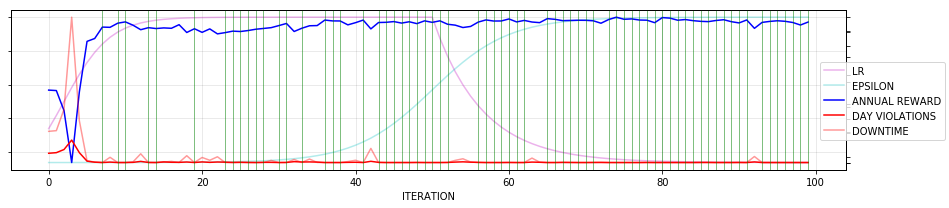

In [19]:
###########################################################################################
###########################################################################################

#PLOT LR AND EPSILON SCHEDULING
fig = plt.figure(figsize=(12,3))
ax = fig.add_subplot(111)
# ax.set_title("LR and EPSILON SCHEDULING V3")
ax.set_xlabel("ITERATION")
# ax.set_ylabel("LR",      color = 'm')
ax.plot(lr_rec,          color = 'm', alpha = 0.3,label="LR")
# ax.tick_params(axis='y', color = 'm')
# ax.ticklabel_format(style='sci', axis='y', scilimits=(-6,-7))
# ax.minorticks_on()

# ax.set_axisbelow(True)
ax.yaxis.set_ticklabels([])

ax.grid(b=True, which='minor', linestyle=':',  color='k', alpha = 0.1)
ax.grid(b=True, which='major', linestyle='-',  color='k', alpha = 0.1)

ax_ = ax.twinx()
# ax_.set_ylabel("EPSILON", color = 'c')
# ax_.tick_params(axis='y', color = 'c')
# ax_.set_axisbelow(True)
# ax_.minorticks_on()
ax_.plot(e_rec,           color = 'c', alpha = 0.3, label="EPSILON")
ax_.yaxis.set_ticklabels([])

# Plot the average reward log
ax1 = ax.twinx()
# ax1.set_ylabel("Terminal Reward", color = 'b')
# ax1.set_ylim([-10,2]);
ax1.plot(avg_reward_rec,'b',label="ANNUAL REWARD")
# ax1.tick_params(axis='y', colors='b')
ax1.yaxis.set_ticklabels([])

# Plot the violation record log
ax2 = ax.twinx()
# ax2.set_ylabel("Violations",color = 'r')
ax2.plot(day_violation_rec,'r', label="DAY VIOLATIONS")
ax2.plot(batt_violation_rec,'r',alpha=0.4, label="DOWNTIME")
for xpt in np.argwhere(batt_violation_rec<1):
    ax2.axvline(x=xpt,color='g',linewidth='0.5')
# ax2.set_ylim([0,50]);
# ax2.tick_params(axis='y', colors='r')
ax2.yaxis.set_ticklabels([])

fig.legend(bbox_to_anchor=(1.1, 0.7))


fig.tight_layout()

###########################################################################################
###########################################################################################

In [20]:
# print("ITERATION #0 :  LR = {:4.2e} @ EPSILON = {:4.2f}".format(lr_rec[0],e_rec[0]))
# print("ITERATION #10:  LR = {:4.2e} @ EPSILON = {:4.2f}".format(lr_rec[10],e_rec[10]))
# print("ITERATION #20:  LR = {:4.2e} @ EPSILON = {:4.2f}".format(lr_rec[20],e_rec[20]))
# print("ITERATION #50:  LR = {:4.2e} @ EPSILON = {:4.2f}".format(lr_rec[50],e_rec[50]))
# print("ITERATION #80:  LR = {:4.2e} @ EPSILON = {:4.2f}".format(lr_rec[80],e_rec[80]))
# print("ITERATION #99:  LR = {:4.2e} @ EPSILON = {:4.2f}".format(lr_rec[99],e_rec[99]))

In [21]:
S_FILENAME = './models/'+ 'demo_'+ MODELNAME
# S_FILENAME = './models/'+ MODELNAME
print("Loading MODEL from FILE: ", S_FILENAME)
dqn = DQN()
dqn.eval_net.load_state_dict(torch.load(S_FILENAME))
dqn.eval_net.eval()
print("DEVICE: ", dqn.device)

Loading MODEL from FILE:  ./models/demo_B0TOKYO_13_36_13_314.pt
DEVICE:  cpu


***MEASURING PERFORMANCE OF THE MODEL***


************************************
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


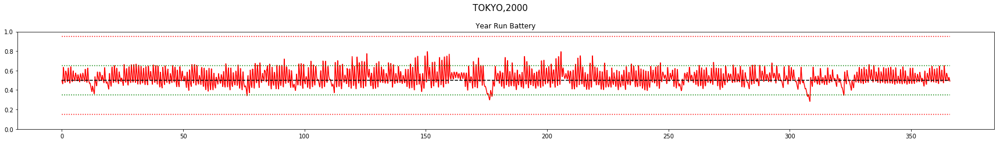



************************************
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


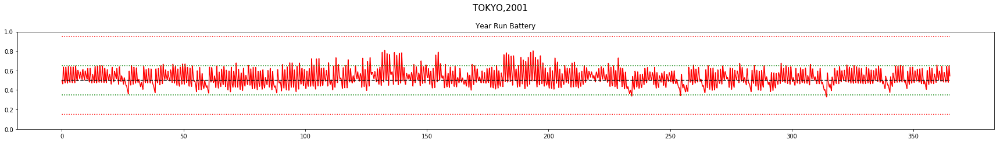



************************************
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


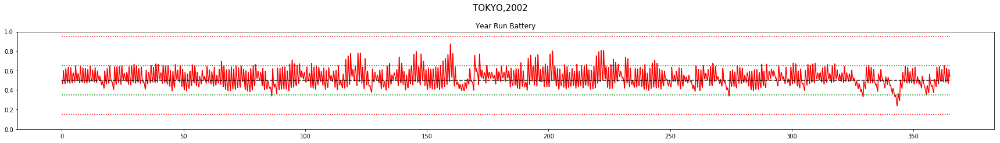



************************************
Day Violations           =      2
Battery Limit Violations =     10
Battery FULL Violations  =      0
Battery EMPTY Violations =     10


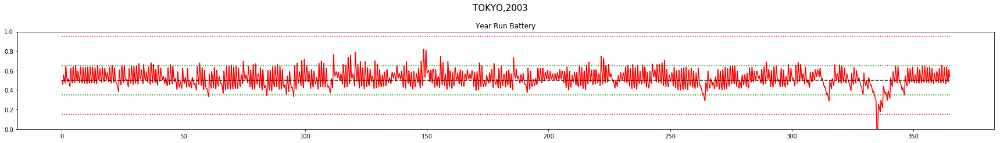



************************************
Day Violations           =      8
Battery Limit Violations =    129
Battery FULL Violations  =      0
Battery EMPTY Violations =    129


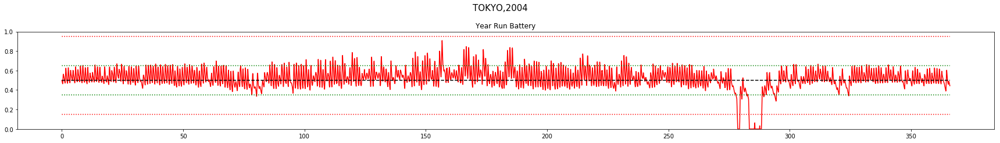



************************************
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


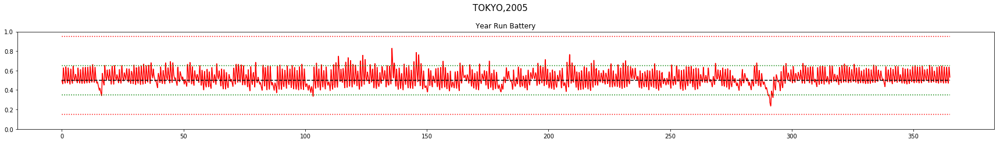



************************************
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


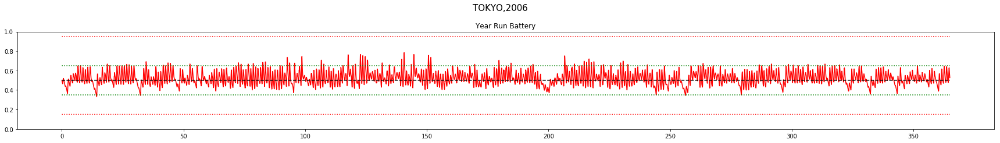



************************************
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


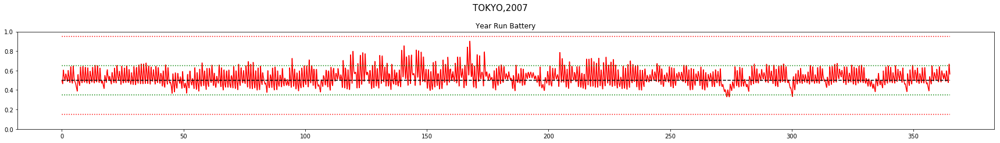



************************************
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


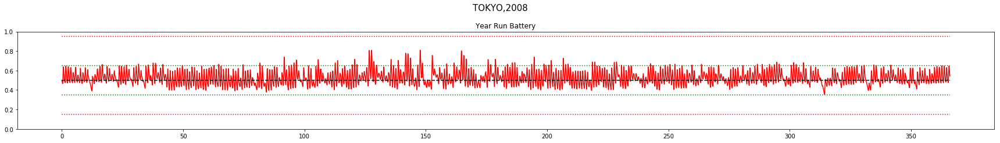



************************************
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


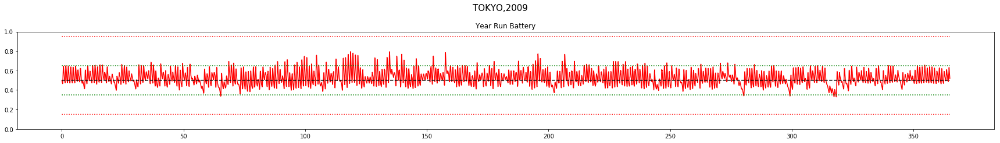



************************************
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


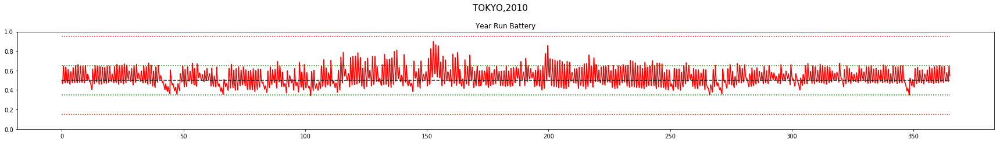



************************************
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


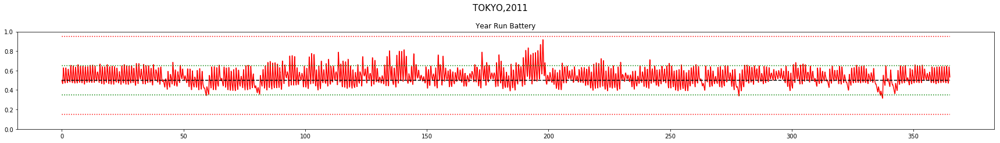



************************************
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


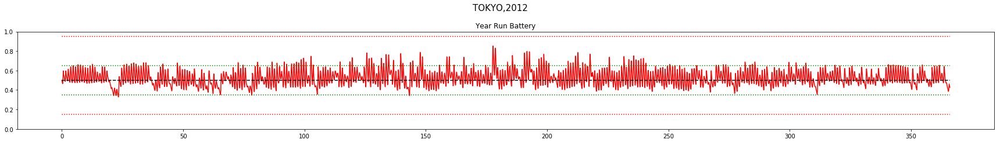



************************************
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


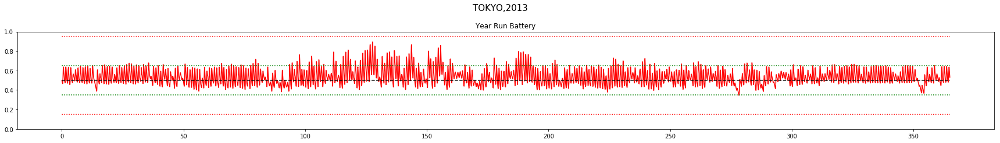



************************************
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


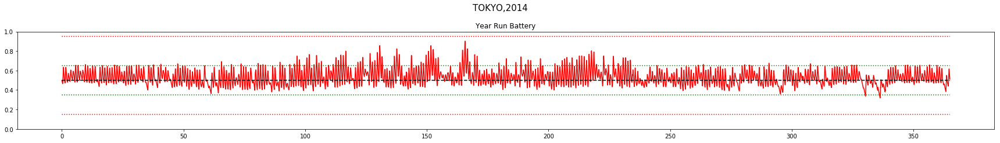



************************************
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


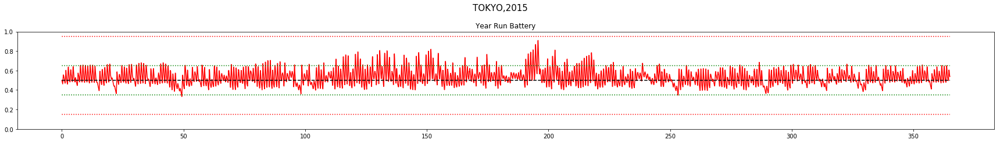



************************************
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


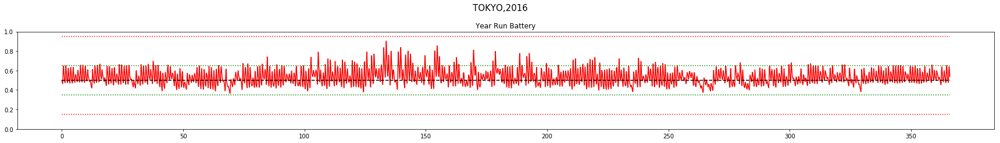



************************************
Day Violations           =      7
Battery Limit Violations =    119
Battery FULL Violations  =      0
Battery EMPTY Violations =    119


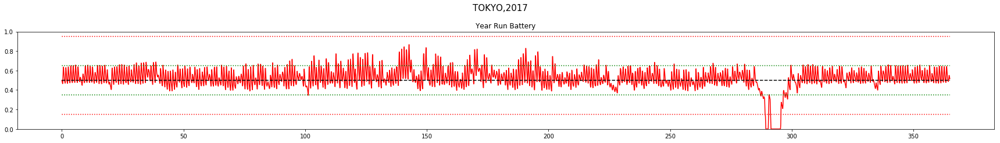



************************************
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


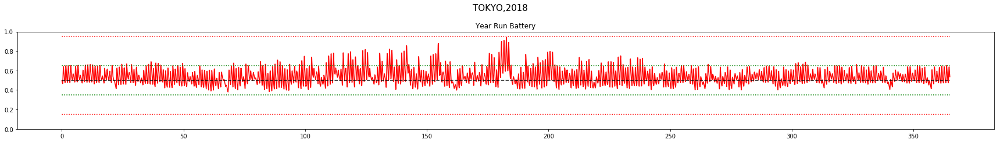



TOKYO
YEAR	AVG_RWD		VIOLATIONS	EMPTY	FULL
			DAY	BATT
2000	 1.37		0	 0	0	0
2001	 1.34		0	 0	0	0
2002	 1.25		0	 0	0	0
2003	 1.26		2	 10	10	0
2004	 1.09		8	 129	129	0
2005	 1.37		0	 0	0	0
2006	 1.38		0	 0	0	0
2007	 1.3		0	 0	0	0
2008	 1.43		0	 0	0	0
2009	 1.35		0	 0	0	0
2010	 1.28		0	 0	0	0
2011	 1.29		0	 0	0	0
2012	 1.31		0	 0	0	0
2013	 1.31		0	 0	0	0
2014	 1.28		0	 0	0	0
2015	 1.26		0	 0	0	0
2016	 1.32		0	 0	0	0
2017	 1.08		7	 119	119	0
2018	 1.29		0	 0	0	0

TOTAL Day  Violations:   17.0
TOTAL Batt  Violations:  258.0
TOTAL EMPTY Violations:  258.0
TOTAL FULL  Violations:  0.0
************************************


In [22]:
#VALIDATION PHASE
print("***MEASURING PERFORMANCE OF THE MODEL***")
# for LOCATION in ['tokyo']:#['wakkanai','aomori','tokyo','fukuoka','minamidaito']:
results = np.empty(6)
for YEAR in np.arange(2000,2019):
    capm      = CAPM(LOCATION,YEAR,shuffle=False, trainmode=False) #instantiate the CAPM class
    capm.eno  = ENO(LOCATION,YEAR, shuffle=False, day_balance=False) #instantiate the environment inside the CAPM class
    capm.HMAX = capm.eno.SMAX #maximum power output of solar cell is set in CAPM object using the value in ENO object

    s, r, day_end, year_end = capm.reset()
    yr_test_record = np.empty(4)

    while True:
        a = dqn.choose_greedy_action(stdize(s))
        yr_test_record = np.vstack((yr_test_record, [s[0],s[2],r, a])) #record battery, henergy, reward and action
        s_, r, day_end, year_end = capm.step(a)
        if year_end:
            break
        s = s_

    yr_test_record = np.delete(yr_test_record, 0, 0) #remove the first row which is garbage
    yr_test_reward_rec = yr_test_record[:,2]
    yr_test_reward_rec = yr_test_reward_rec[::24] #annual average reward
    results = np.vstack((results, [int(YEAR), np.mean(yr_test_reward_rec), int(capm.violation_counter), int(capm.batt_violations), int(capm.batt_empty_counter), int(capm.batt_full_counter)]))
    print("\n\n************************************")
    print("Day Violations           = {:6d}".format(capm.violation_counter))
    print("Battery Limit Violations = {:6d}".format(capm.batt_violations))
    print("Battery FULL Violations  = {:6d}".format(capm.batt_full_counter))
    print("Battery EMPTY Violations = {:6d}".format(capm.batt_empty_counter))
###########################################################################################
###########################################################################################
    #     Plot the reward and battery for the entire year run
    title = LOCATION.upper() + ',' + str(YEAR)
    NO_OF_DAYS = capm.eno.NO_OF_DAYS

    fig = plt.figure(figsize=(24,6))
    fig.suptitle(title, fontsize=15)

#         ax1 = fig.add_subplot(211)
#         ax1.plot(yr_test_reward_rec)
#         ax1.set_title("\n\nYear Run Reward")
#         ax1.set_ylim([-4,2])

    ax2 = fig.add_subplot(211)
    ax2.plot(yr_test_record[:,0],'r')
    ax2.plot(np.ones_like(yr_test_record[:,0])*capm.BOPT/capm.BMAX, 'k--')
    ax2.plot(np.ones_like(yr_test_record[:,0])*capm.BLIM_LO/capm.BMAX, 'r:')
    ax2.plot(np.ones_like(yr_test_record[:,0])*capm.BLIM_HI/capm.BMAX, 'r:')
    ax2.plot(np.ones_like(yr_test_record[:,0])*(capm.BOPT+capm.ENP_MARGIN /2) /capm.BMAX, 'g:')
    ax2.plot(np.ones_like(yr_test_record[:,0])*(capm.BOPT-capm.ENP_MARGIN/2)/capm.BMAX, 'g:')

    ax2.set_title("\n\nYear Run Battery")
    ax2.set_ylim([0,1])
    plt.sca(ax2)
    plt.xticks(np.arange(0, NO_OF_DAYS*24, 50*24),np.arange(0,NO_OF_DAYS,50))
    fig.tight_layout()
    plt.show()
###########################################################################################
###########################################################################################


results = np.delete(results,0,0)
print("\n")
print(LOCATION.upper())
print('YEAR\tAVG_RWD\t\tVIOLATIONS\tEMPTY\tFULL')
print('\t\t\tDAY\tBATT')

for x in np.arange(0,results.shape[0]):
    print('{}\t {}\t\t{}\t {}\t{}\t{}'.format(int(results[x,0]), np.around(results[x,1],2), int(results[x,2]), int(results[x,3]), int(results[x,4]),  int(results[x,5]) ))

print("\nTOTAL Day  Violations:  ",np.sum(results[:, 2]))
print("TOTAL Batt  Violations: ",np.sum(results[:,3]))
print("TOTAL EMPTY Violations: ",np.sum(results[:,4]))
print("TOTAL FULL  Violations: ",np.sum(results[:,5]))
print("************************************")

In [23]:
print('\nRun time: {}'.format(datetime.now() - tic))


Run time: 0:23:45.551058


In [24]:
# YEAR = 2000

In [25]:
# capm = CAPM(LOCATION,YEAR,shuffle=False, trainmode=False) #instantiate the CAPM class
# capm.eno = ENO(LOCATION,YEAR, shuffle=False, day_balance=False) #instantiate the environment inside the CAPM class
# capm.HMAX = capm.eno.SMAX #maximum power output of solar cell is set in CAPM object using the value in ENO object

# s, r, day_end, year_end = capm.reset()
# yr_test_record = np.empty(4)

# while True:
#     a = dqn.choose_greedy_action(stdize(s))

#     #state = [batt, enp, henergy, fcast]
#     yr_test_record = np.vstack((yr_test_record, [s[0],s[2],r, a])) #record battery, henergy, reward and action

#     # take action
#     s_, r, day_end, year_end = capm.step(a)

#     if year_end:
#         break

#     s = s_

# yr_test_record = np.delete(yr_test_record, 0, 0) #remove the first row which is garbage
# yr_test_reward_rec = yr_test_record[:,2]
# yr_test_reward_rec = yr_test_reward_rec[::24]

# title = LOCATION.upper() + ',' + str(YEAR)
# NO_OF_DAYS = capm.eno.NO_OF_DAYS

# fig = plt.figure(figsize=(24,6))
# fig.suptitle(title, fontsize=15)

# #     ax1 = fig.add_subplot(211)
# #     ax1.plot(yr_test_reward_rec)
# #     ax1.set_title("\n\nYear Run Reward")
# #     ax1.set_ylim([-3,3])

# #Plot the reward and battery for the entire year run
# ax2 = fig.add_subplot(111)
# ax2.plot(yr_test_record[:,0],'r')
# ax2.plot(np.ones_like(yr_test_record[:,0])*capm.BOPT/capm.BMAX, 'k--')
# ax2.plot(np.ones_like(yr_test_record[:,0])*capm.BLIM_LO/capm.BMAX, 'r:')
# ax2.plot(np.ones_like(yr_test_record[:,0])*capm.BLIM_HI/capm.BMAX, 'r:')
# ax2.plot(np.ones_like(yr_test_record[:,0])*(capm.BOPT+capm.ENP_MARGIN /2) /capm.BMAX, 'g:')
# ax2.plot(np.ones_like(yr_test_record[:,0])*(capm.BOPT-capm.ENP_MARGIN/2)/capm.BMAX, 'g:')
# ax2.set_title("\n\nYear Run Battery")
# ax2.set_ylim([0,1])
# plt.sca(ax2)
# plt.xticks(np.arange(0, NO_OF_DAYS*24, 50*24),np.arange(0,NO_OF_DAYS,50))
# fig.tight_layout()
# plt.show()

In [26]:
# DAY_START = 320
# DAY_END   = 325

In [27]:
# #Plot the reward and battery for the entire year run on a day by day basis
# title = LOCATION.upper() + ',' + str(YEAR)
# TIME_AXIS = np.arange(0,capm.eno.TIME_STEPS)
# for DAY in range(DAY_START,DAY_END):
#     START = DAY*24
#     END = START+24

#     daytitle = title + ' - DAY ' + str(DAY)
#     fig = plt.figure(figsize=(16,4))
#     st = fig.suptitle(daytitle)

#     ax2 = fig.add_subplot(121)
#     ax2.plot(yr_test_record[START:END,1],'g')
#     ax2.set_title("HARVESTED ENERGY")
#     ax2.set_xlabel("Hour")
#     ax2.set_ylim([0,1.05])
    
#     ax2.text(0.1, 0.6, "TENP = %.2f\n" %(capm.BOPT/capm.BMAX-yr_test_record[END,0]),fontsize=11, ha='left')
#     ax2.text(0.1, 0.5, "BMEAN = %.2f\n" %(np.mean(yr_test_record[START:END,0])),fontsize=11, ha='left')
#     ax2.text(0.1, 0.4, "BINIT = %.2f\n" %(yr_test_record[START,0]),fontsize=11, ha='left')
#     if END < (capm.eno.NO_OF_DAYS*capm.eno.TIME_STEPS):
#         ax2.text(0.1, 0.1, "REWARD = %.2f\n" %(yr_test_record[END,2]),fontsize=13, ha='left')
        
#     #plot battery for year run
#     ax1 = fig.add_subplot(122)
#     ax1.plot(TIME_AXIS,              yr_test_record[START:END,0],'r')
#     ax1.plot(TIME_AXIS, np.ones_like(yr_test_record[START:END,0])*capm.BOPT/capm.BMAX, 'r--')
#     ax1.plot(TIME_AXIS, np.ones_like(yr_test_record[START:END,0])*capm.BLIM_LO/capm.BMAX, 'r-.',alpha=0.5)
#     ax1.plot(TIME_AXIS, np.ones_like(yr_test_record[START:END,0])*capm.BLIM_HI/capm.BMAX, 'r-.',alpha=0.5)
#     ax1.plot(TIME_AXIS, np.ones_like(yr_test_record[START:END,0])*(capm.BOPT+capm.ENP_MARGIN /2) /capm.BMAX, 'g:',alpha=0.5)
#     ax1.plot(TIME_AXIS, np.ones_like(yr_test_record[START:END,0])*(capm.BOPT-capm.ENP_MARGIN/2)/capm.BMAX, 'g:',alpha=0.5)
    
#     ax1.set_title("YEAR RUN TEST")
#     ax1.set_xlabel("Hour")
#     ax1.set_ylabel('Battery', color='r',fontsize=12)
#     ax1.set_ylim([-0.05,1.05])

#     #plot actions for year run
#     ax1a = ax1.twinx()
#     ax1a.plot(yr_test_record[START:END,3]+1)
#     ax1a.set_ylim([0,N_ACTIONS])
#     ax1a.set_ylabel('Duty Cycle', color='b',fontsize=12)
#     ax1a.set_ylim([0,10.25])


#     fig.tight_layout()
#     st.set_y(0.95)
#     fig.subplots_adjust(top=0.75)
#     plt.show()